
<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:5px; margin-top:-5px; margin-bottom:-5px'> <blockquote> <blockquote><em>
<b>Logistic regression</b><br>
 <u>The meaning of the activation function lead analytical solution of the problem of non-linear regression</u>. <ul>
        <em>In particular</em>, in the case of <b>Logistic regression</b> the problem can be given as to find the best hyperplane (line in 2d) to divide to classes.<br>
        In this problem we can write it as follows:
$$ \hat{y}_i=p(y_{i})=f(\sum_{j=0}^M w_j x_{ij})=f(W^T x_{i}),$$
where: <ul>
        <li>$W$ is the weight vector,
        <li> $x_{j}={x_{0j},...,x_{ij},...,x_{Nj}}$ is the j-th input vector of length $N$ of the training data set with $M$ data; 
        <li>$y$ is the labels of classes in form $0$ and $1$ 
        <li> $\hat{y}_{i}=p(y_{i})$ is the estimation of the probability $p(\cdot)$ that input $X_i$ corresponds to the  target class (label 1 or 0) - thus we want make a decision by the rule 
            $$\begin{cases}
            \hat{y} \ge 1/2 \to \text{class 1} \\
            \hat{y} \le 1/2 \to \text{class 0}
            \end{cases}.$$  
        </ul>
        </ul>
       <ul> The simplest solution of this problem is the <b>step function (Heaviside function)</b>,
                    $$\rm {\bf step} = 
                    \begin{cases}
            \hat{y} \ge 0 \to \text{class 1} \\
            \hat{y} \le 0 \to \text{class 0}
            \end{cases}.$$ 
        <br> However, step function if not differential and can not be optimized analytically,
        moreover it has uncertainty value for inflection point $ y=0$</ul>
<u>The analytical solution of the Logistic regression problem is the <b>Maximization of Log-Likelihood function for binominal distribution (Bernoulli distribution)</b></u>
$$
\begin{aligned}
L(y|w^T x)=\prod_{i=1}^NP[y_i|w^T x_{i}]=\prod_{i=1}^N a_i^{y_i}(1-a_i)^{1-{y_i}}
\\
log(L(y|w^T x)) = \sum_{i=1}^N a_i^{y_i}+ \sum_{i=1}^N(1-a_i)^{1-{y_i}}\to max_w
\end{aligned}
$$
where $a=f[w^T x_{i}]$.  Thus,
        $$\frac{\partial log(L(y|w^T x))}{\partial w} \to 0  \implies \frac{\partial P[y_i|w^T x_{i}]}{\partial y}=P[y_i|w^T x_{i}](1-P[y_i|w^T x_{i}])\to 0
        $$ 
The corresponding  function to the expression  is  the <b>Sigmoid</b>:
$$
\begin{aligned}
&P[y_i|w^T x_{i}]=\sigma(w^T x)=P[y_i|w^T x_{i}]=\frac{1}{1+exp⁡{[−w^T x]} }, \\ 
&\frac{\partial\sigma(w^T x)}{\partial w}= \sigma(w^T x)(1-\sigma(w^T x))
\end{aligned}
$$
So we have solution that the activation function $f(\cdot)$ is the $sigmoid$ function.
<br>
<br>        
For the several classes the extension of the sigmoid is the <b>Softmax</b> activation function.<br>
By analogy with the above we have
$$
\text{For two classes}: \sigma(w^T x)\to P[y_i|w^T x_{i}]=\frac{P[y_i=1|w^T x_{i}]}{P[y_i=0|w^T x_{i}]+P[y_i=1|w^T x_{i}] }
$$ 
$$\text{For several classes}: P[y_i|w^T x_{i}]=\frac{P[y_i=class_c|w^T x_{i}]}{\sum_{k=0}^{K-1}P[y_i=class_k|w^T x_{i}]} \to 
 \textbf{softmax}=\frac{exp⁡{[w_c^T x]}}{\sum_{k=0}^{K-1}exp[w_k^T x]},
$$
where $c$ is the current class and $K$ is number of classes.<br>
$$
\frac{\partial(\text{softmax}(x))}{\partial x} = \text{softmax}(x)(1−\text{softmax}(x))
 $$
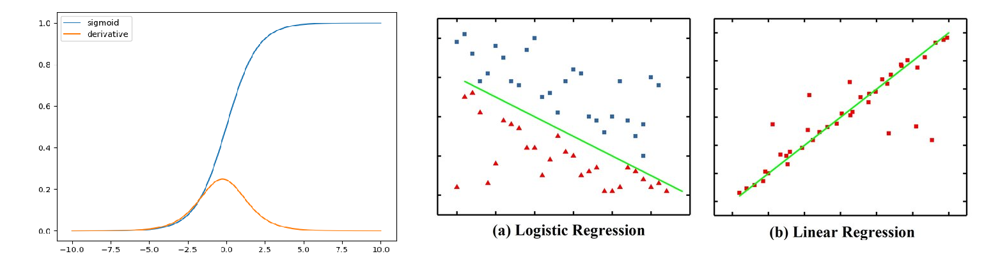


## The Gradient Descent Method
<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-1px; margin-bottom:-1px'> <blockquote>
    The problem of training can be written as 
    $$ L_i = L(y_i,W,X_i)=L\big(y_i -f(W^TX_i)\big)\to min, $$ 
where <ul>
    <li> $L_i $ is the error of training, ( the loss function);
    <li> $f(W^TX_i)$ is the some non-linear result of the network or its layer
        <ul>
            <li> $W$ is the weights matrix;
            <li> $X_i$ is the layer input;
            <li> $f(\cdot)$ is the activation function. 
        </ul>   
    </ul>
<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-1px; margin-bottom:-1px'><ul>
    Thus the our task is to minimize the error i.e. minimize the loss function value.    <br><br>
    In other words, we can proposed that for optimal weights $W$ the value of $L_i$ will be sufficiently small. 
    <br><br>
    Hence the task is to select the $W$ values optimally.
    </ul> 
    
    
<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-1px; margin-bottom:-1px'>  <blockquote><blockquote>    
The easier way to optimize $W$ is make it iteratively. For this we can write the truncated Taylor Series transformation.  for scalar value $W$ the equation can be written as 
    $$L_i\approx L(W^*,x,y_i)+L'(W^*,x,y_i)(W−W^* )$$
    and for matrix of weights as
    $$ L_i=L(W^t,X_i,y_i)\approx L(W^*,x,y_i)+\left(\nabla_W L(W^*,x,y_i)\right)^T(W−W^*), $$
where <ul>
        <li> $W^*$ is the point of Taylor Series transformation,
        <li>$\nabla_W = \{\frac{\partial}{\partial W_0}, \frac{\partial}{\partial W_1}, ..., \frac{\partial}{\partial W_M}\},$ and $M$ is the number of weights.<br>
         <li>$\nabla_W L_i$ is the gradient of loss function.
    </ul>
 <font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-1px; margin-bottom:-1px'>    
    For the the iterative process with steps $1,...,t-1,t,... N$. on the each step:
    $$L(W^t,X_i,y_i)\approx L(W^{t-1},X_i,y_i)+(\nabla_W L(W^{t-1},X_i,y_i))^T(W^t-W^{t-1}). $$
In the derivation above the error was the matrix. But for one value estimation we need to take some norm of this error matrix for Frobenius Norm we have the following
    $$
    \|L(W^t,X_i,y_i)\|\approx \|L(W^{t-1},,X_i,y_i)\|+\|\nabla_W L(W^{t-1},X_i,y_i)\|\|W^t-W^{t-1}\|\cos(\gamma), 
    $$
where $\gamma$ has the meaning of scalar product of vectors. <br>
     In other word it shown the angle between vectors $\nabla L(W^{t-1},X_i,y_i)$ and $W^t-W^{t-1})$.
     <br> The difference between $L(W^t,X_i,y_i)$ and $L(W^{t-1},X_i,y_i)$ attains the minimum when
    $\nabla L(W^{t-1},X_i,y_i)$ and $W^t-W^{t-1}$ would be in opposite directions, thus $\cos(\gamma) = -1$ and
    $$
    W^t-W^{t-1}\approx - \nabla L(W^{t-1},X,y).
    $$
The task of iterative minimization  can be rewritten as the<br>
    <b>The Gradient Descent Method</b>
    $$
    W^t=W^{t-1} -\eta \nabla L(W^{t-1},X_i,y_i),
    $$
where $\eta$ is the learning rate.<br>
     In the prectice we will calculate the weights update by a set of samples (set of $i$). In this case we need to rewrite this equation as
     $$ W^t=W^{t-1} -\eta \frac{1}{N}\sum_{i=0}^{N-1}\nabla L(W^{t-1},X_i,y_i),$$
     where <ul>
         <li> N is the number of samples (i.e. <b>Batch</b>).
         <li> $\frac{1}{N}\sum_{i=0}^{N-1} L(W,X_i,y_i)$ is the so-called <b>cost function</b>.  
     </ul>
 <font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-1px; margin-bottom:-1px'>       
<em>Notes</em><ul>
    <li> The gradient descent means that we move weights $W$ in  the opposite direction to the gradient increasing.
    <li> if $L=L(y,f(W^TX))$, than $$W^t=W^{t-1}-\eta \frac{\partial L}{\partial f}\odot\nabla f^T (W^{t-1}X)X,$$
        where $\odot$ is the element-wise or Handmare product.
    <li> Iteration routine  does not guaranty that reached minimum would be the global minimum.  
    <li> In general $\eta$ could be changed during the training.
    <li> The solution $W^*$ may depend on the initialization procedure, If the loss function behavior supposed no to be smooth everywhere.
    <li> frequently each iteration can be called <b>epoch</b>.
    <li> The minimum value for train data can lead to the   overfitting, thus use the cross-validation to prevent it.  
    <li> The local and global minimums of function corresponds to zeros of its gradient, thus then closer to the zero then smaller the gradient value.
     <li> The routine of training need to be stopped if 
    <ul>
        <li> $t\geq t{limited},$
        <li> $\|W^t\| - \|W^{t-1}\|<\epsilon,$
        <li> $e(W^t,X)-e(W^{t-1},X)<\epsilon,$ 
        <li> Early-stop by Cross-validation.
    </ul>    
</ul>    

<font size=4.5pt  face = 'georgia' style='Line-height :2'><p style='text-align: left;'><blockquote>
 <b> The  Cibenko-Hronik Theorem </b> (1989) state that the each restricted function 𝑓(𝑥) can be approximated by the following solution:
$$𝑓(𝑥)= \sum_{𝑖=1}^{𝑁}\alpha_𝑖  \sigma(𝑊^𝑇 𝑋+𝑊_0) \quad \text{such that } \  𝐿(𝑓(𝑥),𝑓 ̂(𝑥))<\varepsilon(𝑁,𝑀)$$
Where <ul>
    <li>$\varepsilon(𝑁,𝑀)$ is sufficiently small error,
    <li>$𝑓 ̂(𝑥)$ is the approximation result,
    <li>$\sigma(𝑊^𝑇 𝑋+𝑊_0)$ is the nonlinear regression of input layer (represent a hidden layer)
    <li>$\alpha_𝑖$ is the weight for each output of hidden layer
    <li>$N$ is the number of synapses between hidden and output layer
    <li>$M$ is the number of inputs.    
        </ul>
    This theorem is also called the <b>fundamental theorem of the neural network approximation.</b> <br>
    The main problems of Hronik-Cybenko and Rosenblatt neural network is: <ul>
        <li>The dependence of the number of perceptron in hidden layer on the accuracy.
        <li>The problem of computational complexity
        <li>The damn of dimension – the number of perceptron growth as exponent value of inputs
        <li>The dependence of the number of inputs on the accuracy.
        <li>The problem of collecting data
        <li>The data should be divided in the number of classes 
        <li>All classes should have similar size and range of values.
        </ul> 


<font size=4.5pt  face = 'georgia' style='Line-height :2'><p style='text-align: left;'><blockquote>       
    <b>The theorem of no free lunch (NFL theorem,  Wolpert and Macready theorem) </b> – Any two algorithms (or Neural networks) give equal (in average) results on all possible datasets (which include unlearned cases).
The theorem state we can’t construct the neural network which will be work well on unlearned data or data which significantly different from our training dataset.
    
<font size=4.5pt  face = 'georgia' style='Line-height :2'><p style='text-align: left;'><blockquote>      
<b>Condorcet's jury theorem  </b> state that if we  have a several independent estimators and each has probability of right answer more than 0.5 than in average our mean answer will be right.
If probability of right answer less than 0.5, than in average our answer will be false.
The theorem state that than our training data seems to our real data than results of our neural network will be better.



<font size=4.5pt  face = 'georgia' style='Line-height :2'><p style='text-align: left;'><blockquote>   
 <b>   Full-connected neural network</b><br><br>
The Rumelhart multilayer perceptron the simples neural network (full-connected neural netwrok).
The Rumelhart multilayer perceptron (MLP): <ul>
    <li>Use several of layers (input, hidden, output).
    <li>Using methods of gradient descent to learn network.
    <li>Using of full-connected nets architecture (each perceptron of one layer is connected to the each perceptron of other layer).
    <li>Introduce probability based approach. </ul>
    
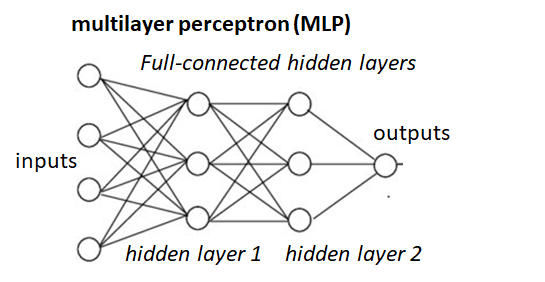

<font size=4.5pt  face = 'georgia' style='Line-height :2'><p style='text-align: left;'><blockquote>   
   <b> The gredient descent problem for MLP </b> <br>
Let's assume that the last layer (output) is the non-linear regressor in form:
$$ \hat y = a_L = f(W^T_La_{L-1}) = f(z_{L}),$$
where <ul>
    <li> $a_{L-1}$ is the out put vector of the previous layer ($L-1$) - i.e. input for the Last layer (number $L$).
    <li> $a_{L}$   is the output of the last layer.
    <li> $W^T_{L}$ is the weight vector between the previous layer ($L-1$) and the last one ($L$).
    <li> $z_{L} = W^T_La_{L-1}$ is the so-called logit (or linear part of the regression).
    </ul>
<font size=4.5pt  face = 'georgia' style='Line-height :2'><p style='text-align: left;'>     
We can solve this problem using gradient descent, shown above.<br>
Let's now rewrite the problem of non-linear regression for the several layers:
$$ 
    \hat y = f\big(W_{L}^Ta_{L-1}\big)=
    f\big(W_Lf(W_{L-1}^Ta_{L-2})\big)=...
    =f\Big(W_L^Tf\big(...f(W_1^Ta_0)\big)\Big),
$$
where <ul> $a_0 = X$ is the input vector.
  The solution of this can be obtained analtically for the several layer. <br>But, what should we do if we will have a 1000 of layers? <br>
    <b>The backward propagation method Idea:</b><ul>
        <li>calculation of how the obtained error change for each perceptron in propagation in the direction from output to input.
        <li>If we understand this, we can update each weight on the optimal value.
        <li>The method is optimization scheme of gradient descent for graph-based function, imply two stages:<ul>
            <li>1. forward propagation stage on which outputs are calculated
             <li>2. backward propagation stage on which the error is propagated in back direction and weights updated by error obtained values 
            </ul></ul>
<font size=4.5pt  face = 'georgia' style='Line-height :2'><p style='text-align: left;'> 
    The forward propagation stage (see example of the network above): 
    <ul>
    <li> Let the input be $a_0=X$; 
    <li> For 1-st hidden layer for each neuron $i$ we have  
        $$a_{1_i}=f({W_{1_i}}^T a_0)=f(z_{1_i}),$$
    or $$a_1=f(W_1^T a_0)=f(z_1),$$ for vector of first layer outputs, where $W_1$ is matrix.
    <li>For 2-nd hidden layer  $$ a_2=f(W_2^T a_1)=f(z_2). $$
    <li> For output layer $$\hat y=a_3=f(W_3^T a_2)=f(z_3).$$
    <li> The error is calculated as $ L= L(\hat{y},y )$, and its derivative can be given as $e =\nabla L$.
    <li> Let's concidering the last layer error again:
        $${\nabla_{W_L}} L(y, \hat y) = \frac{\partial L }{\partial W_L}= \frac{\partial L }{\partial \hat y} \frac{\partial \hat y }{\partial z_L}  \frac{\partial z_L }{\partial  W_L} = \big(e \odot \frac{\partial f(z_L)}{\partial z_L} \big)  a_{L-1}^T, $$
     where: $e = {\partial L }/{\partial \hat y} = \nabla L$ gradient of loss function.
    <li> Let's concidering the last-1 layer:
    $${\nabla_{W_{L-1}}} L(y, \hat y) = \frac{\partial L }{\partial \hat y} \frac{\partial \hat y }{\partial z_L} \frac{\partial z_L }{\partial z_{L-1}}  \frac{\partial z_{L-1} }{\partial  W_{L}} 
    = \big(e_{L-1} \odot \frac{\partial f(z_{L-1})}{\partial z_{L-1}} \big)  a_{L-2}^T $$
    where  $$e_{L-1} = W_L^Te\odot \frac{\partial f(z_L)}{\partial z_L} $$      
    <li> For any arbitary layer we can write:    
$$\frac{\partial L}{\partial W_l} = \frac{\partial L }{\partial \hat y} \frac{\partial \hat y }{\partial z_L} \frac{\partial z_L}{\partial z_{L-1}} ... \frac{\partial z_l }{\partial  W_{l+1}} = \bigg(e_l \odot \frac{\partial f(z_l)}{\partial z_l} \bigg) a_{l-1}^T,$$ where $e_l = W_{l+1}^Te_{l+1}\odot \frac{\partial f(z_{l+1})}{\partial z_{l+1}}$ 
    </ul> 
<font size=4.5pt  face = 'georgia' style='Line-height :2'><p style='text-align: left;'> 
    In other words we can rewrite <b>backpropagation rules</b> as:    
$$\Delta W_l \leftarrow \frac{1}{N} \sum_{i=0}^{N-1}  {\nabla_{W_l}} L(y_i, \hat y_i) = \frac{1}{N} \sum_{i=0}^{N-1} \left(e_{l} \odot \frac{\partial f(z_{l})}{\partial z_l} \right) a_{l-1}^T  $$    
and
$$W_l^{t} = W_l^{t-1} - \eta \frac{1}{N} \sum_{i=0}^{N-1} \nabla_{W_l}L(y_i,\hat{y}_i) $$
   
<font size=4.5pt  face = 'georgia' style='Line-height :2'><p style='text-align: left;'> 
    <em>Note</em> <ul>
    <li> In some cases it is valuable to denote bias separate of the weights. In this case for bias:
        $$\Delta b_l \leftarrow \frac{1}{N} \sum_{i=0}^{N-1}  \nabla_{b_l} L(y_i,\hat{y}_i) =
        \frac{1}{N}\sum_{i=0}^{N-1}\left(e_l\odot \frac{\partial f(z)}{\partial z}\right) $$ 
        and 
        $$b_l^{t} = b_l^{t-1} - \eta \frac{1}{N}\sum_{i=0}^{N-1} \nabla_{b_l} L(y_i,hat{y}_i) $$
    <li> For sigmoid $$\sigma(z) = \frac{1}{1+\exp(-z)};\quad \frac{\partial \sigma(z)}{\partial z} =\sigma(z)(1-\sigma(z))$$ 
    <li> For Binary cross entropy: 
        $$ L = - y\log {\hat y} - (1-y)\log {[1 - \hat y]}; \quad  e = \frac{\partial L}{\partial \hat y} = -\frac {y-\hat y}{\hat y (1-\hat y)}$$
    <li> For Binary cross entropy with logits:  
     $$  L = - y\log {\sigma(z_L)} - (1-y)\log {[1 - \sigma(z_L)]} $$
     $$ \nabla L = \frac{y}{\sigma(z_L)}-\frac{1-y}{1-\sigma(z_L)}) $$ 
     $$ \nabla L\odot \nabla \sigma(z) = \left(\frac{y}{\sigma(z_L)}-\frac{1-y}{1-\sigma(z_L)}\right)\sigma(z_L)(1-\sigma(z_L)) = y - \sigma(z_L) = y -\hat{y} $$  
   <li> For multiclass  cross entropy:
      $$ L = - \sum_{k=0}^{K} y\log {\mathrm{softmax}(z_{L})}$$
      $$ \nabla L\odot \nabla \mathrm{softmax}(z) =y - \mathrm{softmax}(z_L) $$

Example<blockquote>  
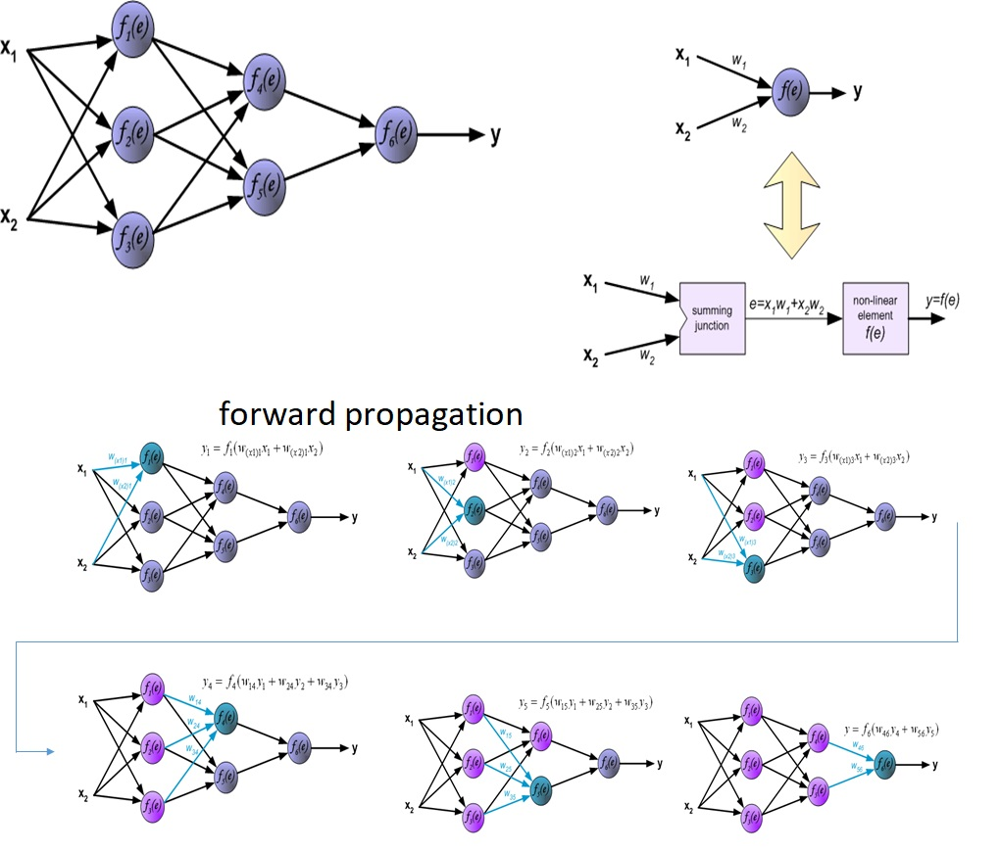
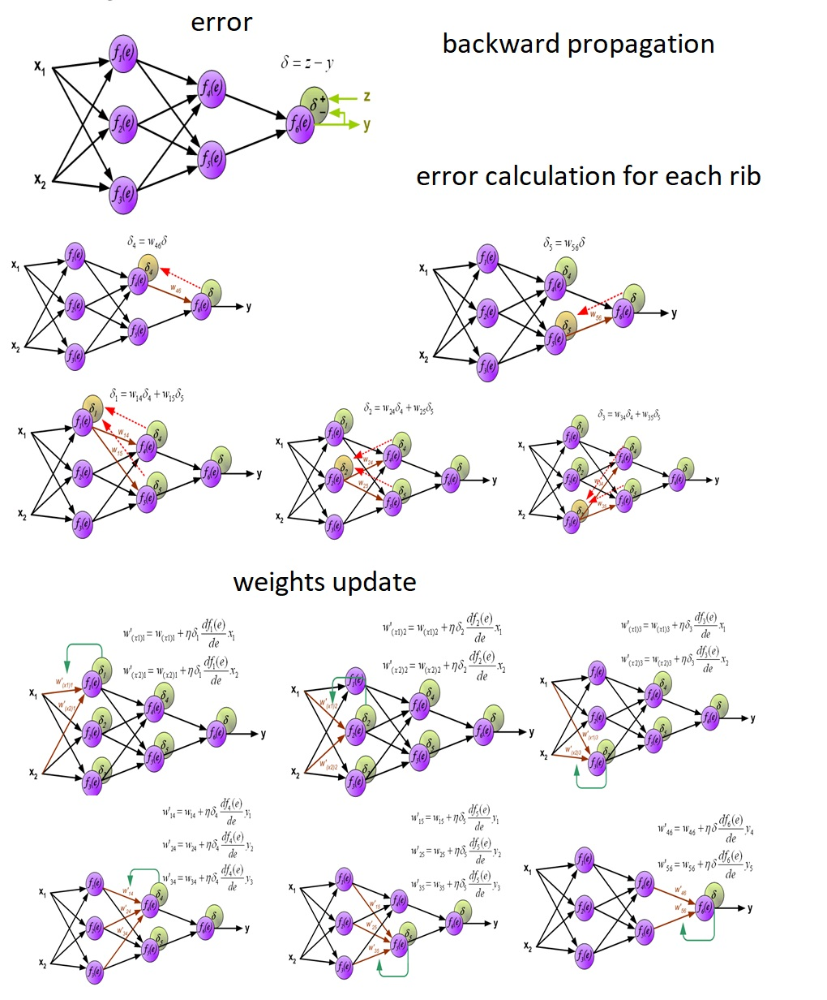

## Convolution Operation in Depth 
### 2D-Convolution

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:35px'> <blockquote>
The principle of the convolution work for 1 channel is the following operation
<span style='text-align: justify; padding:35px; font-size:x-large' >    
$$ r[i,j] = (k\ast x)[ij] = \sum_{a=0}^{k_h-1}\sum_{b=0}^{k_w-1}k[a,b]x[i+a,j+b], $$</span>  
where $r$ is the convolution output for convolution of input image $x$ and kernel $k$ with size $k_h\times k_w$. 
    
<!-- ![](https://cdn-media-1.freecodecamp.org/images/gb08-2i83P5wPzs3SL-vosNb6Iur5kb5ZH43) -->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:35px'><blockquote>
The meaning of each kernel in CNN is to extract some feature, as it shown in the example below.
    
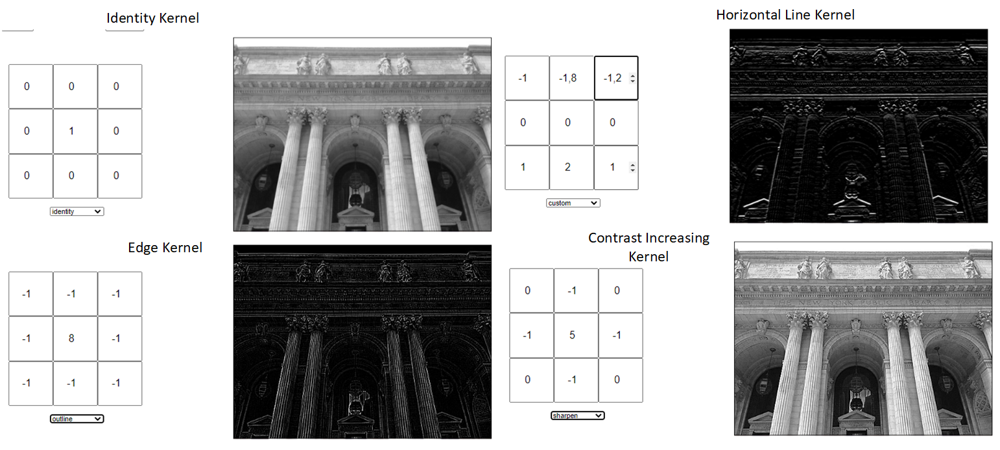

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: center; padding:35px'><blockquote>
You may find a lot of how simple convolution filter work [here ](https://setosa.io/ev/image-kernels/).

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:35px'><blockquote>
The convolution operation is equal to the sliding by the filter through the image as it shown in the example: 

<div>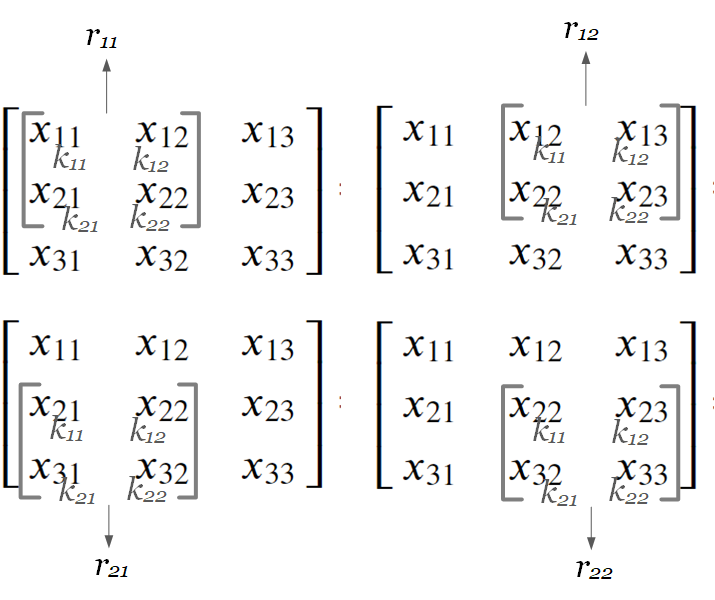

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:35px'>
    <blockquote>
So we can actually rewrite convolution using pointwise (or element-wise, Hadamard) product $\odot$ as
```python
    r[0,0] = np.sum(x[:3,:3]  * k) 
    r[1,0] = np.sum(x[1:4,:3] * k)
    r[2,0] = np.sum(x[2:5,:3] * k)
    r[0,1] = np.sum(x[:3,1:4] * k) 
    r[0,2] = np.sum(x[:3,2:5] * k) 
```
    $$ r[ij] = \sum_{ij}{x[i:i+k_h,j:j+k_w]\odot k}$$

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: center; padding:35px'> <blockquote>   
Actually the convolution operation can be represented trough the convolution matrix.<br> In the example below you may see the case of valid convolution operation representation in the matrix form 

<!-- https://github.com/Dyakonov/DL/blob/master/2019/AMD_DL03cnn_18.pdf -->

<blockquote><p style='font-size:x-large'>
$$
\begin{aligned}
&r = k\ast x = \boldsymbol{k}\cdot \vec{x} =
\begin{bmatrix}
    k_{11}       & k_{12}   \\
    k_{21}       & k_{22}   \\
\end{bmatrix} 
*
\begin{bmatrix}
    x_{11}       & x_{12} & x_{13}  \\
    x_{21}       & x_{22} & x_{23}  \\
    x_{31}       & x_{32} & x_{33} 
\end{bmatrix} 
=  \\ &=
\begin{bmatrix}
    k_{11} & k_{12} & 0      & k_{21} & k_{22} & 0 & 0 & 0 & 0  \\
         0 & k_{11} & k_{12} & 0      & k_{21} & k_{22} & 0 & 0 & 0 \\
         0 & 0 & 0  & k_{11} & k_{12} & 0      & k_{21} & k_{22} & 0 \\
         0 & 0 & 0  & 0 & k_{11} & k_{12} & 0      & k_{21} & k_{22} \\
\end{bmatrix} 
\cdot
\begin{bmatrix}
 x_{11} \\
 x_{12} \\ 
 x_{13} \\
 x_{21} \\
 x_{22} \\ 
 x_{23} \\
 x_{31} \\
 x_{32} \\ 
 x_{33} \\ 
\end{bmatrix} 
= \\ &=
\begin{bmatrix}
k_{11}x_{11}+ k_{12}x_{12} + k_{21}x_{21} + k_{22}x_{22}\\
k_{11}x_{21}+ k_{12}x_{31} + k_{21}x_{22} + k_{22}x_{23}\\
k_{11}x_{31}+ k_{12}x_{21} + k_{21}x_{31} + k_{22}x_{32}\\
k_{11}x_{22}+ k_{12}x_{23} + k_{21}x_{32} + k_{22}x_{33}\\
\end{bmatrix}
=
\begin{bmatrix}
r_{11} \\
r_{12} \\
r_{21} \\
r_{22} \\
\end{bmatrix}
\to 
\begin{bmatrix}
r_{11} & r_{12} \\
r_{21} & r_{22} 
\end{bmatrix}
\end{aligned}
$$

<font size=4.5pt  face = 'georgia' style='Line-height :2.5'><div style='text-align: justify; padding:35px'><blockquote>
    where:<ul>
        <li> $r$ is convolution output;    
        <li> $k$ is the kernel matrix;
        <li> $x$ is the input image; 
        <li> $\boldsymbol{k}$ is the convolution matrix, made from kernel;  
        <li> $\vec{x}$ is the vectorized (flatten) input image;
    </ul>    

<font size=4.5pt  face = 'georgia' style='Line-height :2.5'><div style='text-align: justify; padding:35px'><blockquote><blockquote>
    <em>Note</em> matrix multiplication is the operation made by the rule:<br>
    <ul> Each output element $ij$ is sum of product of $i$-th row of first matrix and $j$-th column of the second matrix.</ul>
    For the previous example:<blockquote>
<p style='font-size:x-large'>
$$  
\begin{aligned}
&r_{11} = 
\begin{bmatrix}
    k_{11} & k_{12} & 0      & k_{21} & k_{22} & 0 & 0 & 0 & 0  \\        
\end{bmatrix} 
\cdot
\begin{bmatrix}
 x_{11} \\
 x_{12} \\ 
 x_{13} \\
 x_{21} \\
 x_{22} \\ 
 x_{23} \\
 x_{31} \\
 x_{32} \\ 
 x_{33} \\ 
\end{bmatrix} = \\ 
&= k_{11}x_{11}+ k_{12}x_{12} + k_{21}x_{21} + k_{22}x_{22}
\end{aligned}
$$

<div>
    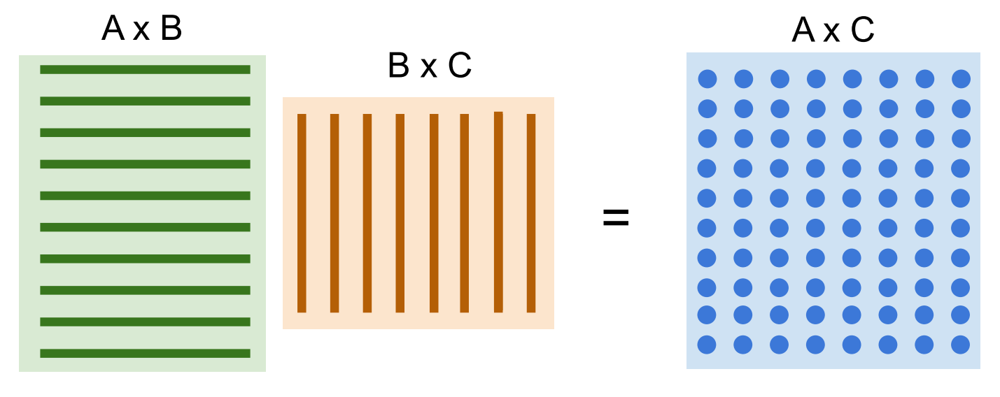
    
<!-- http://cs231n.stanford.edu/slides/2020/lecture_6.pdf -->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:35px'>
    
<blockquote>
For better understanding the convolution in multi-dimension case it is useful to consider the 1-d case first.
    
The 1d convolution can be described as
$$r = k\ast x = \boldsymbol{k}\cdot \vec{x},$$ 
where:
* $k$ is the weights vector $k=(k_0, k_1, ..., k_{K-1})$, $K$ is the kernel size.,
* $x$ is the input vector, $x = (x_0, x_1, ..., x_{N-1})$, $N$ is the input size, and $\vec{x} = x^T$,     
* $\boldsymbol{k}$ is the convolution matrix.
$$ 
\boldsymbol{k} = 
\begin{bmatrix}
    k_0 & k_1 & \dots & k_{K-1} & 0       & \dots & 0 & \dots & 0 \\
    0   & k_0 & \dots & k_{K-2} & k_{K-1} & \dots & 0 & \dots & 0 \\
    \dots \\
    0   & 0   & \dots & 0       & 0       & \dots & k_0 & \dots & k_{K-1}\\
\end{bmatrix}
$$
    
$$ 
\begin{aligned}
    &r = k\ast x = \boldsymbol{k}\cdot \vec{x} = 
    \begin{bmatrix}
        k_0 & k_1 & \dots & k_{K-1} & 0       & \dots & 0 & \dots & 0 \\
        0   & k_0 & \dots & k_{K-2} & k_{K-1} & \dots & 0 & \dots & 0 \\
        \dots \\
        0   & 0   & \dots & 0       & 0       & \dots & k_0 & \dots & k_{K-1}\\
    \end{bmatrix}
    \cdot
    \begin{bmatrix}
         x_{0} \\
         x_{1} \\
         x_{2} \\ 
         \vdots \\
         x_{n-1} \\ 
    \end{bmatrix}
    = \\ &=
    \begin{bmatrix}
         k_0\cdot x_0 + k_1 \cdot x_1 + \dots + k_{K-1} \cdot x_{K-1} \\
         k_0\cdot x_1 + k_1 \cdot x_2+ \dots + k_{K-1} \cdot x_{K}   \\
         k_0\cdot x_2 + k_1 \cdot x_3 + \dots + k_{K-1} \cdot x_{K+1}   \\
         \vdots \\
         k_0\cdot x_{n-1-K} + k_1 \cdot x_{n-K} + \dots + k_{K-1} \cdot x_{n-1}   \\
    \end{bmatrix}
    =
        \begin{bmatrix}
         r_{0} \\
         r_{1} \\
         r_{2} \\ 
         \vdots \\
         r_{n-1} \\ 
    \end{bmatrix}
\end{aligned}
$$
Example of 1-d convolution 
    
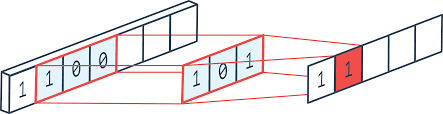
    
><i> Note</i>: The filter kernel size $K$ corresponds to the receptive field size in classical CNN approach.<br>    
    <!-- https://peltarion.com/knowledge-center/documentation/modeling-view/build-an-ai-model/blocks/1d-convolution-block -->

<font size=4.5pt  face = 'georgia' style='Line-height :2.5'><div style='text-align: justify; padding:35px'><blockquote>
The matrix representation of the convolution is also known as <br> <b>kn2raw</b> or <b>kernel to raw</b>. <br> 
The  the order of operations  kn2raw can be transformed to the case known as 
<b>Img2col</b> or <b>Image to column</b>.
<br>
The Img2col is also could be shown as below

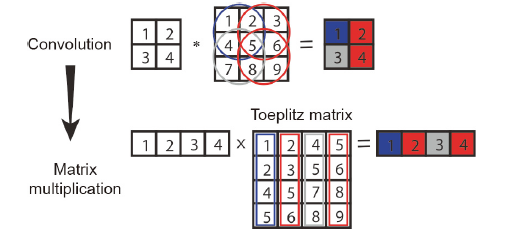

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:35px'><blockquote>
    Beside the simple convolution (<b>direct loop convolution</b>) representation as it shown above, it can be proposed several types of acceleration the convolution operation:<ol>
    <li> <b>direct loop convolution</b>.
    <li> <b> Image to column convolution (im2col)</b>.
    <li> <b> kernel to column convolution (kn2col)</b>.        
    <li> <b>Convolution though the Fast Fourier Transform (FFT)</b>:<ul>
    $$r = \mathcal{F}^{-1}( \mathcal{F}(k)\cdot\mathcal{F}(x)),$$
<blockquote>
        where $\mathcal{F}$ and $\mathcal{F}^{-1}$ are the direct and inverse Fast Fourier <blockquote>Transforms; and in the case of the $k$ the kernel is zero-padded to the shape of image.</ul>
<li> <b>Fast Winograd algorithm (Winograd)</b>: method is based on the dividing the input image to a set of small blacks and simplification the complexity for convolution for each of the blocks.


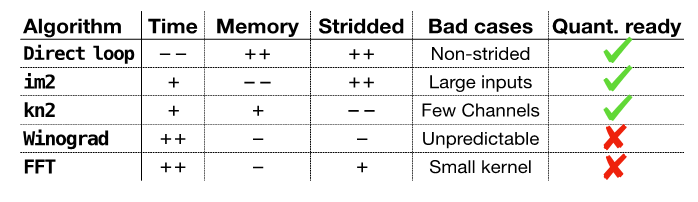

<!-- https://community.arm.com/developer/research/b/articles/posts/even-faster-convolutions-winograd-convolutions-meet-integer-quantization-and-architecture-search -->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: center; padding:35px'><blockquote>
So the convolution can be represented as sliding window which is moving through the image <br>with any predefined stride (stride=1 in the example).<br>
    
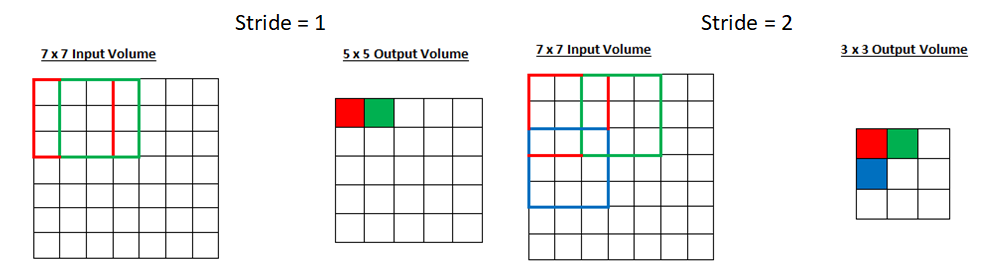
    
<!--     https://adeshpande3.github.io/A-Beginner%27s-Guide-To-Understanding-Convolutional-Neural-Networks-Part-2/ -->

<font size=4.5pt  face = 'georgia' style='Line-height :2.5'><div style='text-align: justify; padding:35px'>
    <blockquote><blockquote>
The convolution can be carried out with or without padding. <br>
<b> The padding  </b> is the operation of virtually add values beside the image boards.<br> As a rule zero-values padding is using.
 It can be distinguished 
    <li> <b>same</b> padding (with add such zeros that the output size will be equal to the input one).
    <li> <b>valid</b> padding (without add zeros).
     <li> <b>full</b> padding (with add such number zeros that increase the output image size on the kernel size - 1).   

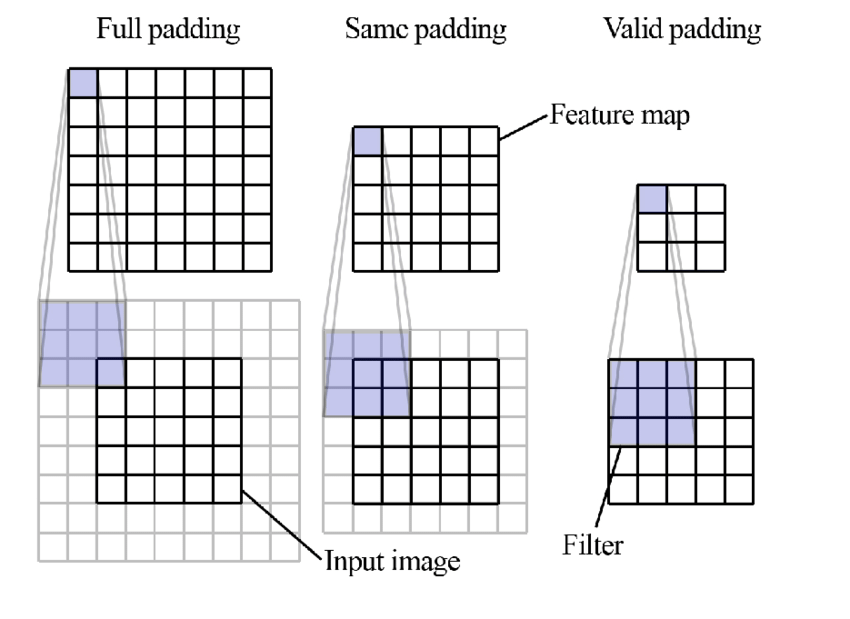
<!-- https://www.researchgate.net/profile/Tyrone-Nowell/publication/336587478/figure/fig7/AS:814608390557702@1571229183220/Padding-of-a-2D-image.png -->

<font size=4.5pt  face = 'georgia' style='Line-height :2.5'><div style='text-align: justify; padding:35px'>
    <blockquote><blockquote>
The output size of the convolution will be 
<p style='font-size:x-large'>
$$dim(r) =r_h\times r_w = (\frac{x_h-k_h+2p_h}{s_h}+1) \times (\frac{x_w-k_w+2p_w}{s_w}+1),$$ </p>
<blockquote>
        where:<ul>
<li>The output image size $r_h\times r_w$;    
<li>The input image size $x_h\times x_w$;
<li>The kernel image size $k_h\times k_w$;    
<li>The padding size <ul><li> $p_h$ is the number of addition columns and <li> $p_w$, is the number of addition raws; </ul> 
<li>The stride size <ul><li> $s_h$ is the stride in the horizontal direction <li> $p_w$, is the stride in the vertical direction. </ul>
</ul>    


<blockquote>
    Here is another example for kernel with size 3
<p style='font-size:large'>
$$
\begin{bmatrix}
r_{11} & r_{12} \\\\
r_{21} & r_{22}
\end{bmatrix}
=
\begin{bmatrix}
k_{11} & k_{12} & k_{13} \\\\
k_{21} & k_{22} & k_{23} \\\\
k_{31} & k_{32} & k_{33}
\end{bmatrix}
*
\begin{bmatrix}
x_{11} & x_{12} & x_{13} & x_{14}\\\\
x_{21} & x_{22} & x_{23} & x_{24}\\\\
x_{31} & x_{32} & x_{33} & x_{34}\\\\
x_{41} & x_{42} & x_{43} & x_{44}
\end{bmatrix}
\to
\begin{bmatrix}
r_{11} \\\\
r_{12} \\\\
r_{21} \\\\
r_{22}
\end{bmatrix}
=
\boldsymbol{k}\cdot
\begin{bmatrix}
x_{11}\\\\
x_{12}\\\\
\vdots \\\\
x_{44}
\end{bmatrix}
$$
where
<p style='font-size:x-large'>
$$
\boldsymbol{k}=
\left[\begin{smallmatrix}
k_{11} & k_{12} & k_{13} & 0 & k_{21} & k_{22} & k_{23} & 0 & k_{31} & k_{32} & k_{33} & 0 & 0 & 0 & 0 & 0\\\\
0 & k_{11} & k_{12} & k_{13} & 0 & k_{21} & k_{22} & k_{23} & 0 & k_{31} & k_{32} & k_{33} & 0 & 0 & 0 & 0\\\\
0 & 0 & 0 & 0 & k_{11} & k_{12} & k_{13} & 0 & k_{21} & k_{22} & k_{23} & 0 & k_{31} & k_{32} & k_{33} & 0\\\\
0& 0 & 0 & 0 & 0 & k_{11} & k_{12} & k_{13} & 0 & k_{21} & k_{22} & k_{23} & 0 & k_{31} & k_{32} & k_{33}\\\\
\end{smallmatrix}
\right]
$$

<!-- https://datascience.stackexchange.com/questions/20565/why-we-use-transposed-filter-as-the-deconvolution-operation-instead-of-the-pseud -->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:35px'>
 <blockquote>   
As extension of the simple convolution in may cases the dialed convolution can be applied.
<p style='font-size:x-large'>    
$$ r[i,j] = (k\ast_l x)[ij] = \sum_{a=0}^{k_h-1}\sum_{b=0}^{k_w-1}k[a,b]x[i\cdot l+a,j \cdot l+b], $$</p><blockquote>
where $l $ is the dialed step.    

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:35px'>
    
<table style="width:100%">
  <caption style='color:black; font-size:large; text-align: center'>Types of convolutions</caption>  
  <tr>
    <td style='color:black; font-size:large; text-align: center'>Traditional convolution</td>
    <td style='color:black; font-size:large; text-align: center'>Dialed convolution</td>
  </tr>
  <tr>
    <td> <img src="https://miro.medium.com/max/435/0*oX5IPr7TlVM2NpEU.gif" alt="Alt text that describes the graphic" title="Title text" /></td>
    <td><img src="https://miro.medium.com/max/435/0*3cTXIemm0k3Sbask.gif" alt="Alt text that describes the graphic" title="Title text" /> </td>

  </tr>

</table>



<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:35px'>
<blockquote>
<blockquote> 
    <i>Notes:</i>
Example of multi-scaled dialed convolution for 1d-case and 2d-case receptive field increasing. 

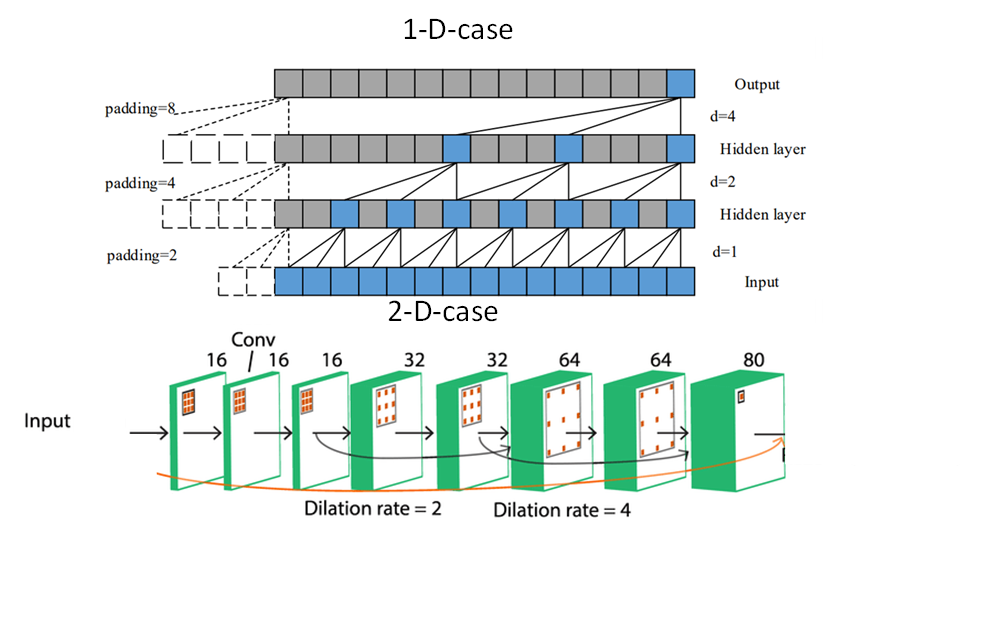

<!-- https://iopscience.iop.org/article/10.1088/1742-6596/1213/4/042050/pdf -->

<!-- https://www.researchgate.net/figure/Modified-8-convolutional-layer-HighRes3dNet-15-architecture-with-dilated-convolutions_fig2_325359097 -->


<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: center; padding:35px'><blockquote>
As it can be seen the dialed convolution allowing increase <br>the receptive field without increasing the kernel size.    

### Multiple Channel Multiple Kernel (MCMK) Convolution 2D 

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:35px'>
   <blockquote> 
As a rule a set of convolution kernels simultaneously applied for a input tensor (set of feature maps)<br> for obtain one output feature map.<br>
Thus, in fact you obtain 3d-convolution which is a sum of 2d-convolution with a corresponding set of kernels.<br> 
    <blockquote>
<p style='font-size:x-large'> <blockquote>   
$$ r[i,j] = (k\ast x)[ij] = \sum_{c=0}^{C-1} \big[ \sum_{a=0}^{k_h-1}\sum_{b=0}^{k_w-1}k^с[a,b]x^c[i+a,j +b]\big], $$</p>
where $C$ is the number of input feature maps and $k^с$ is the kernel for $c$-th feature map.  <br> 
For obtaining several output feature maps we need  several 3-d sets of kernels. 
    

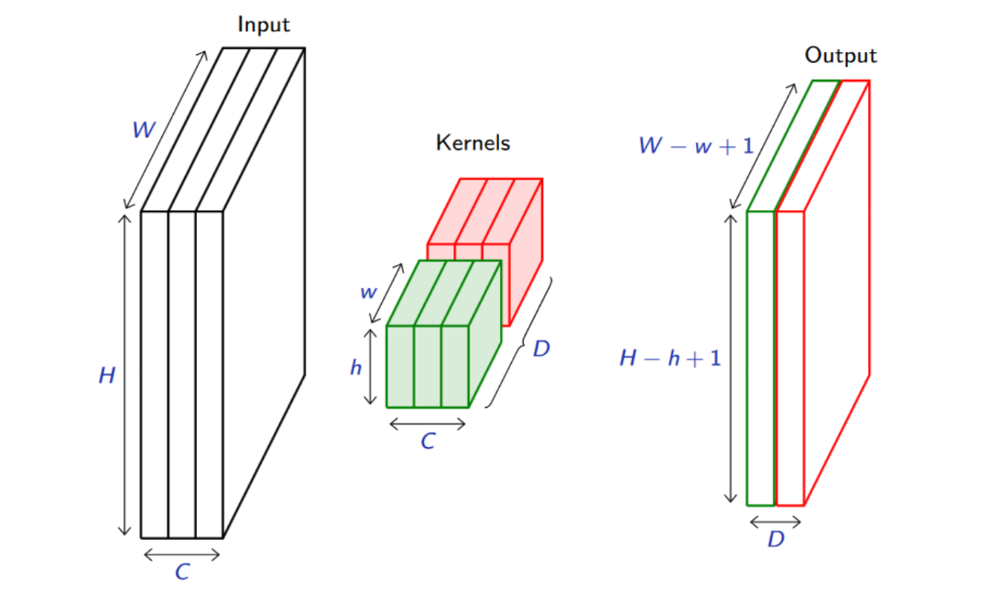

<!-- https://github.com/Dyakonov/DL/blob/master/2019/AMD_DL03cnn_18.pdf -->

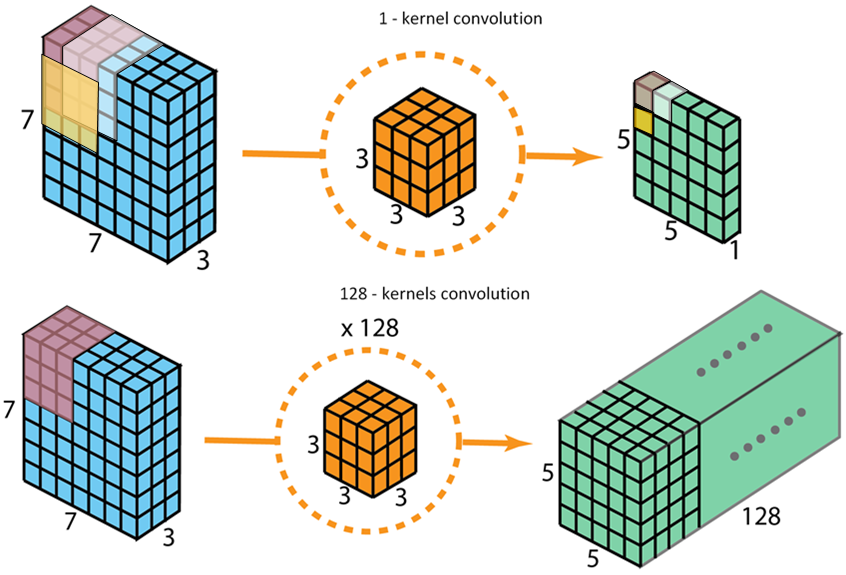

<!-- https://www.machinelearningmastery.ru/a-comprehensive-introduction-to-different-types-of-convolutions-in-deep-learning-669281e58215/ -->

![](https://miro.medium.com/max/2640/1*q95f1mqXAVsj_VMHaOm6Sw.gif)

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: center; padding:35px'><blockquote>
Another illustration of how to obtain $ r = (k\ast x) =  \sum_{c=0}^{C-1}(k^c\ast x^c)$ <br><br>

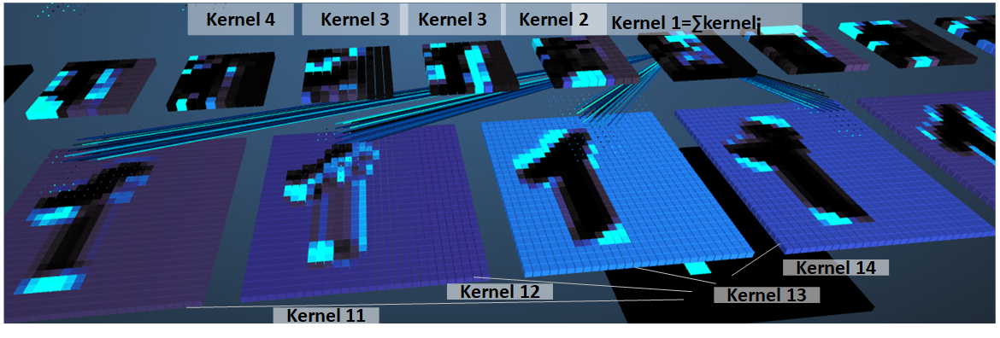
    
<!--     https://www.cs.cmu.edu/~aharley/vis/conv/ -->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:35px'><blockquote>
In Addition to convolution as its self the bias is always add for each feature map.<br>
<span style='text-align: justify; padding:35px; font-size:x-large'>  <blockquote>  
$$ 
\begin{align}
&r[i,j] = (k\ast x)[ij] =  \sum_{c=0}^{C-1}(k^c\ast x^c)[ij] =\\ &= \sum_{c=0}^{C-1} \big[\sum_{a=0}^{k_h-1}\sum_{b=0}^{k_w-1}k^с[a,b]x^c[i+a,j +b,c]\big]+bias, 
\end{align}
$$ 

![](https://cdn-media-1.freecodecamp.org/images/gb08-2i83P5wPzs3SL-vosNb6Iur5kb5ZH43)    

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:35px'>
  <blockquote>  
So we can actually rewrite convolution using pointwise (or element-wise, Hadamard) product $\odot$ as
```python
r[0,0,0] = np.sum(X[:3,:3,:3]  * k0[:3,:3,:3]) + b0
r[1,0,0] = np.sum(X[1:4,:3,:3] * k0[:3,:3,:3]) + b0
r[2,0,0] = np.sum(X[2:5,:3,:3] * k0[:3,:3,:3]) + b0
r[0,1,0] = np.sum(X[:3,1:4,:3] * k0[:3,:3,:3]) + b0
r[0,0,1] = np.sum(X[:3,:3,:3]  * k1[:3,:3,:3]) + b1
```
<blockquote>
$$ r_{c_{out}}[ij] = \sum_{ijc}{x[i:i+k_h,j:j+k_w,0:C_{in}-1]\odot k_{c_{out}}}+b_{c_{out}}$$
 <blockquote>   
where $c_{out}$ is the output channel; $C_{in}$ is the number of input channels; $b_{c_{out}}$ is the kernel bias.

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:35px'>
<blockquote>
In more mathematical view we could have as input an image ($X$) with height $H$, width $W$ and $C_{in}$ channels such that $x\in R^{H\times W\times C_{in}}$. Subsequently for a bank of $C_{out}$ filters we have $K\in R^{k_w \times k_h\times C_{in} \times C_{out}}$ and biases $b\in R^{C_{out}}$, i.e. one for each filter.
<blockquote>
$$
\begin{align}
r_{c_{out}}[ij] = (x \ast k_{c_{out}})_{ij} &= \sum_{m = 0}^{k_w - 1} \sum_{n = 0}^{k_h - 1} \sum_{c = 1}^{C_{in}} k_{c_{out}}(m,n,c) \cdot x(i+m, j+n, c) + b_{c_{out}}
\end{align} 
$$

<font size=4.5pt  face = 'georgia' style='Line-height :2.5'><div style='text-align: justify; padding:35px'>
<blockquote> 
<em> Note:<em>    
    For the set of convolutions the <b> img2col </b> convolution can be represented to the matrix product form, such as:

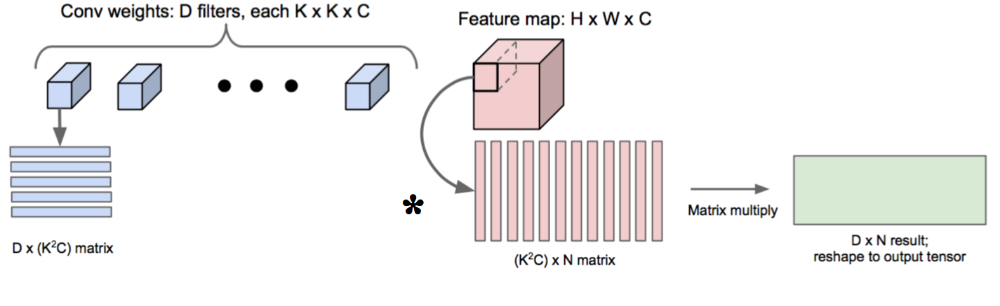
    
where N is virtual number of patches through the input feature map. 

<!-- https://leonardoaraujosantos.gitbook.io/artificial-inteligence/machine_learning/deep_learning/convolution_layer/making_faster -->

<font size=4.5pt  face = 'georgia' style='Line-height :2.5'><div style='text-align: justify; padding:35px'><blockquote>
<font size=4.5pt  face = 'georgia' style='Line-height :2.5'><div style='text-align: justify; padding:35px'>
<blockquote> 
Other representations of img2col and kn2raw convolutions:
Img2col
    
<div>
    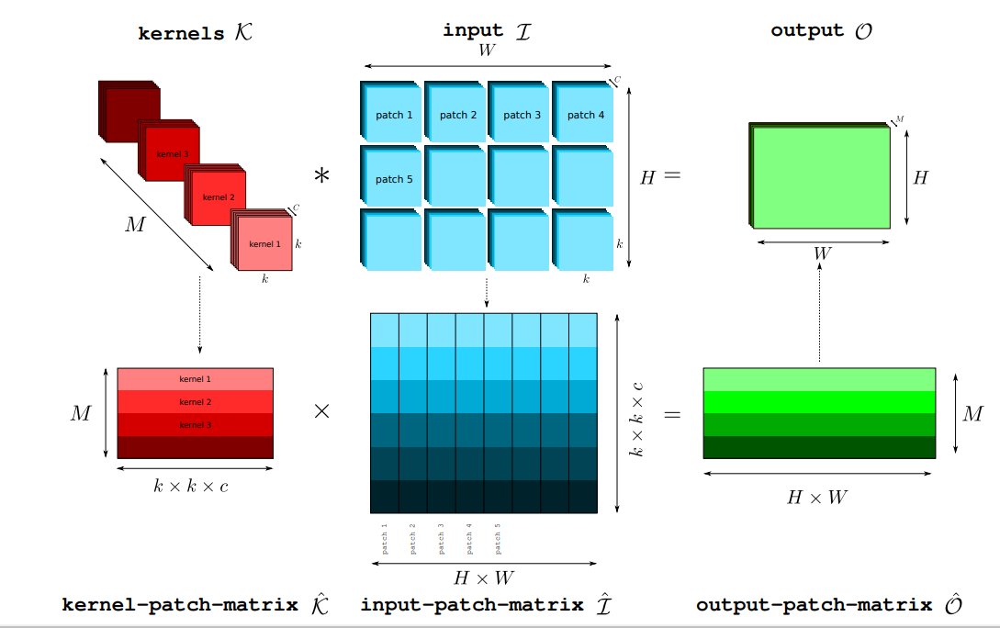
    
<!--     https://www.sciencedirect.com/science/article/pii/S2095809919306356 -->

<font size=4.5pt  face = 'georgia' style='Line-height :2.5'><div style='text-align: justify; padding:35px'>

> kn2raw
    
> <div>
    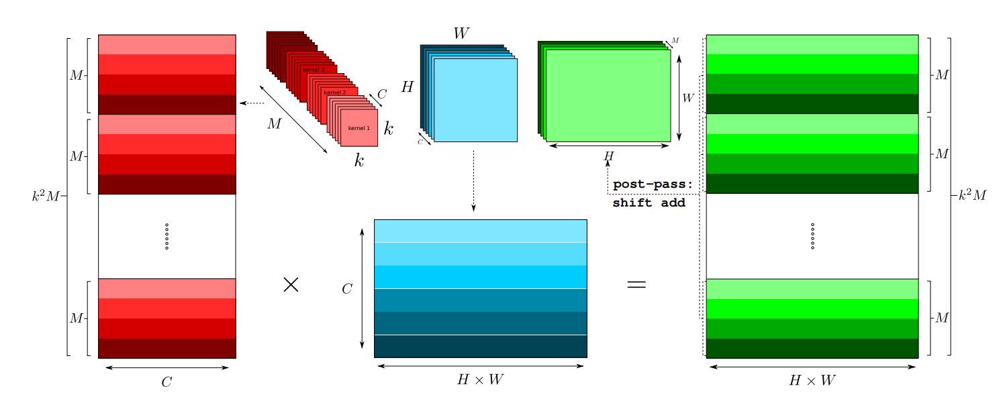
<!--               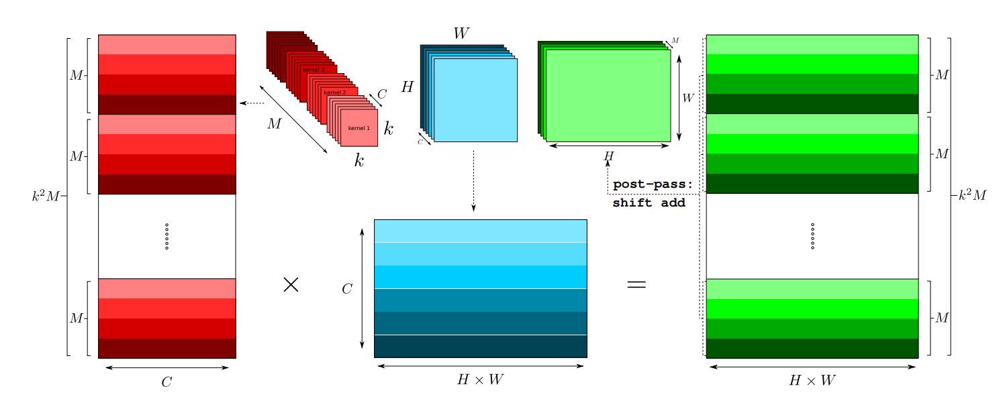 -->
<!-- ![image.png](attachment:image.png) -->
    
<!--     https://www.x-mol.com/paper/1252451749525872640 -->
<!--     https://www.sciencedirect.com/science/article/pii/S2095809919306356 -->

<font size=4.5pt  face = 'georgia' style='Line-height :2.5'><div style='text-align: justify; padding:35px'>
<blockquote> 
The <b>img2col</b> Implementation CNN layer is the most popular.
    
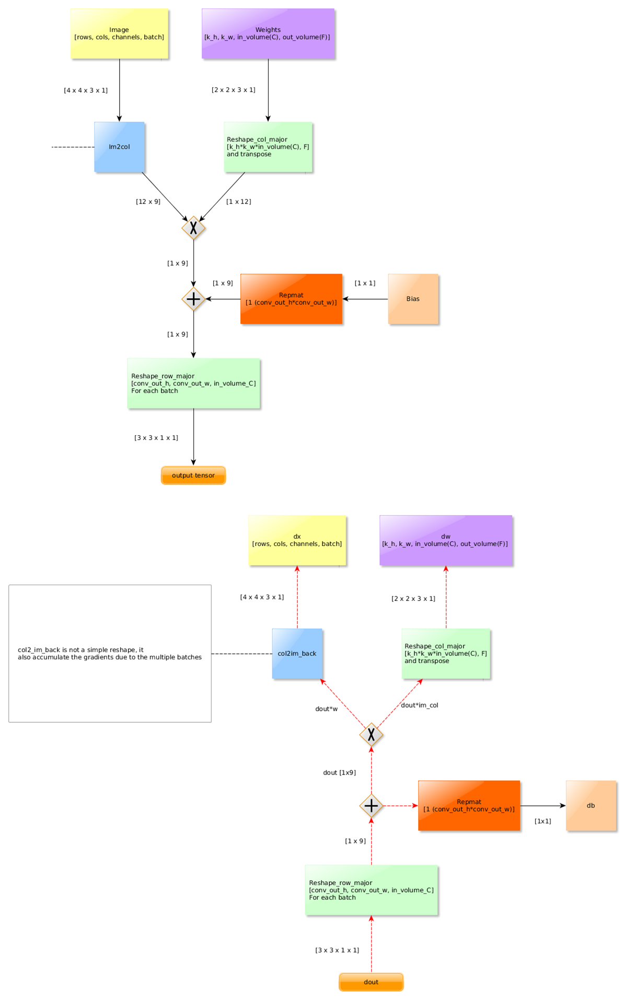
    
   <!-- https://leonardoaraujosantos.gitbook.io/artificial-inteligence/machine_learning/deep_learning/convolution_layer/making_faster --> 

### Types of Convolution

<font size=4.5pt  face = 'georgia' style='Line-height :2.5'><div style='text-align: justify; padding:35px'>
    <blockquote>
Beside from the conventional (Square-kernel convolution) it can be distinguished a several its modifications.<br>
    <b>The main motivations for modify traditional convolution </b> are:<ul>
    <li> Reducing number of parameters without loose of accuracy.
    <li> Increase the receptive field (i.e. sensitive to feature while automatically extraction during model training).
   <li>  Increase sensitivity to feature by layer complication with minimal increase of computation cost.
   <li>  make convolution more effective for our computational resources.    
        
 <!-- https://www.programmersought.com/article/96374024682/    -->
<!-- https://medium.com/hitchhikers-guide-to-deep-learning/10-introduction-to-deep-learning-with-computer-vision-types-of-convolutions-atrous-convolutions-3cf142f77bc0 -->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:35px; margin-bottom:-40px'>
 <blockquote>   
Depends on the architecture of convolution neural network  the following<br> <b>types  of convolutions</b> are proposed.<ol>

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:35px'><blockquote><blockquote>
<li> <b>Square-kernel convolution </b> (for instance, $3\times 3\times C$).
    <ul>The one wide convolution can be replaced with several convolution smaller (like $5\times 5$ kernel can be replaced with 2 sequential $3\times 3$ kernels).</ul>
    <blockquote>
<div>
    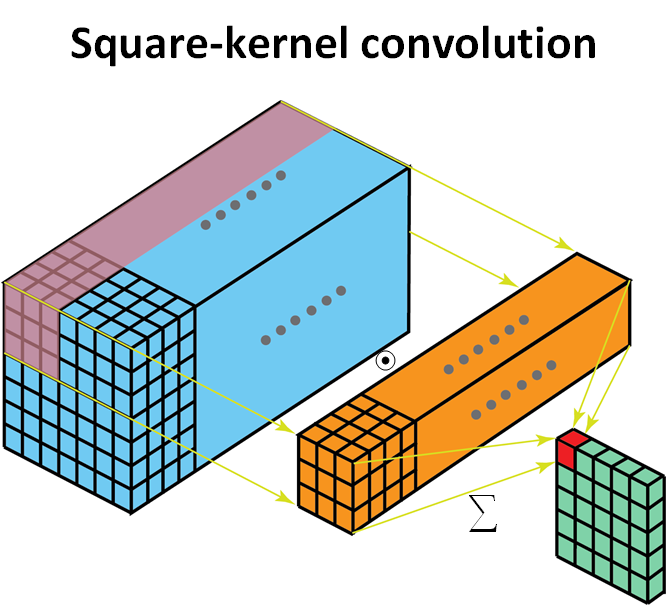
    </div>

<div><blockquote>
    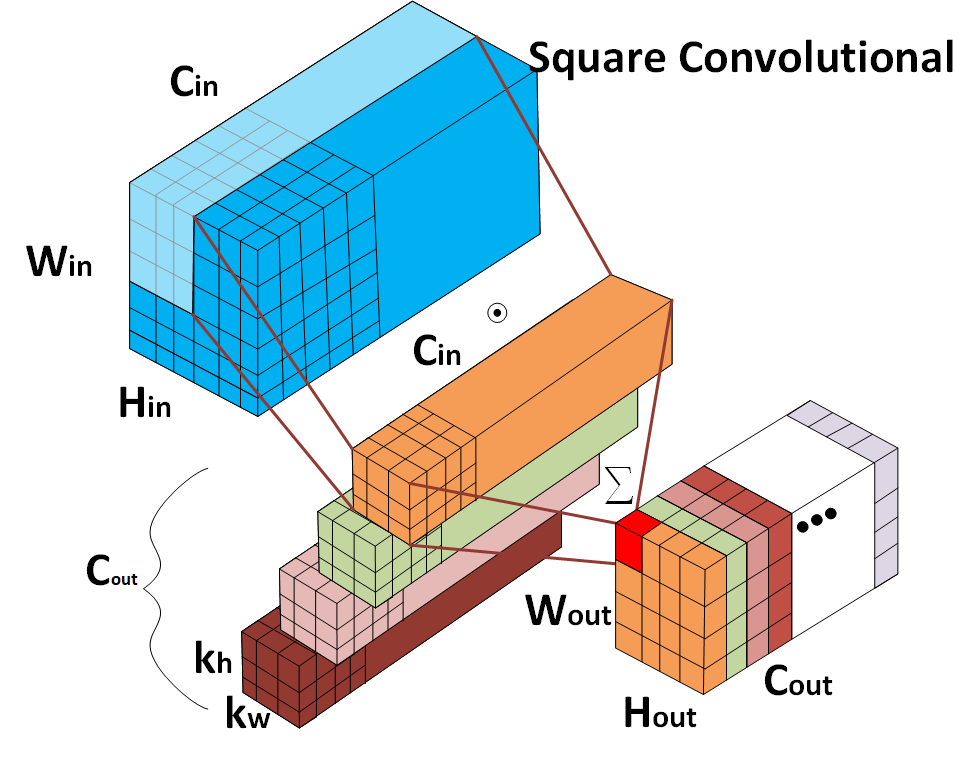
    </div>

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:35px; margin-top:-35px; margin-bottom:-35px'><blockquote>
    <b> Cascade Convolution </b><ul> 
     Beside the simple implementation of the convolution it is important to note that one convolution $5x5$ with stride 1 can be replaced on two convolution $3x3$ without loose of receptive filed.
     <br> However, in this case the full number of parameters reduced to $$ 2 \times 3 \times 3 = 18 \text{ versus }  1 \times 5 \times 5 = 25   $$ 
    And the number of non-linearities can also be increased.
  </ul>


  
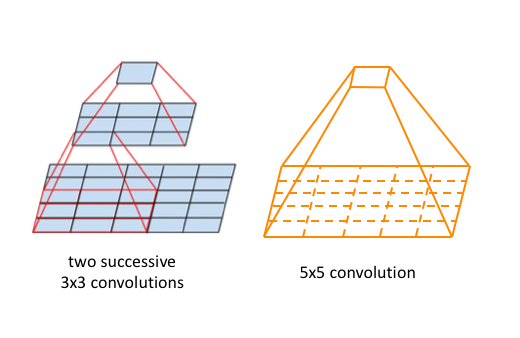



<!-- https://discuss.pytorch.org/t/dynamic-structure-of-cnn/45870/2 -->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:35px'>
    <blockquote>
<li> <b>Dialed-kernel Convolution (Atrous Convolution)</b> (for instance, $3\times 3\times C$ <u>with dialed rate 2</u>).
    <ul>Reduce the number of parameters with keep wider receptive field (without change $5\times 5$ kernel with $3\times 3$ kernels we can take one dialed $3\times 3$ kernel with rate $2$ ).</ul>  
<div>
    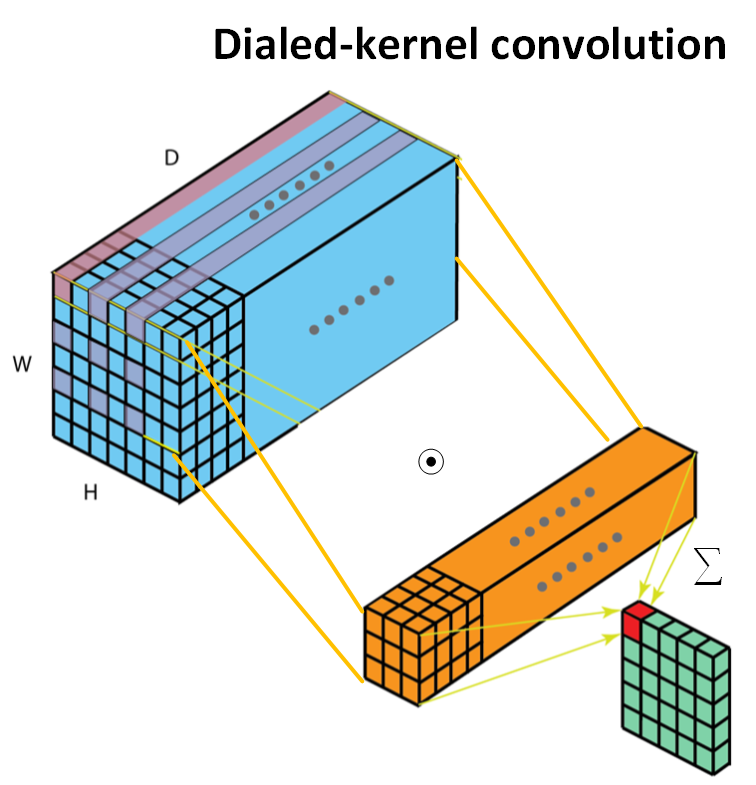
    </div>
<!-- 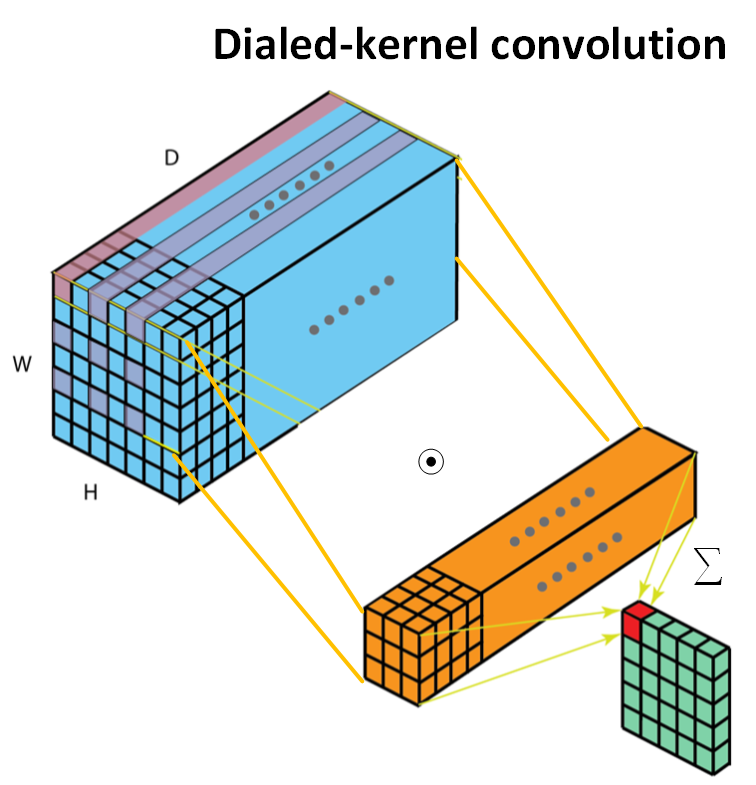 -->



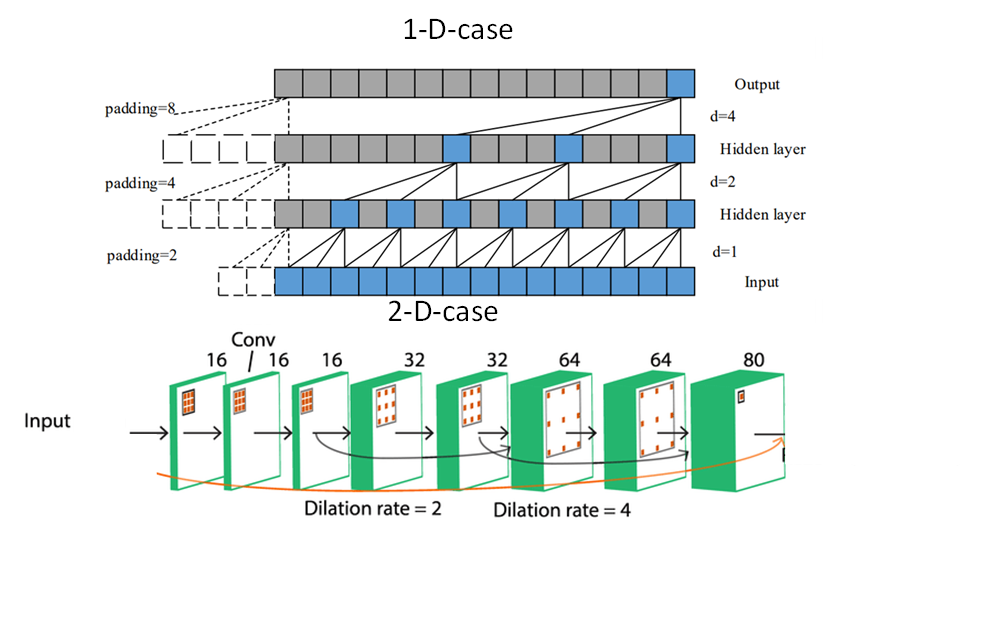

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:35px'>
    <li> <b> Deformable-Kernel Convolution </b> (for instance, 
    $3\times 3\times C$ <u>with arbitrary dialed rate </u>). 
    <ul> The expansion of dialed convolution for the case of arbitrary rate in each dimension. The main idea here is to increase the virtual receptive filed using virtually wide kernel with virtual pruning.  </ul>
    <div>
    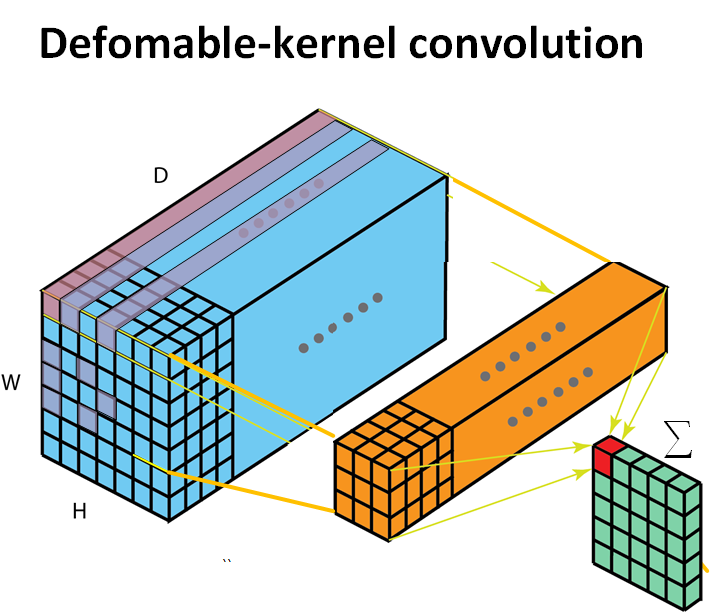
    </div>
<!-- 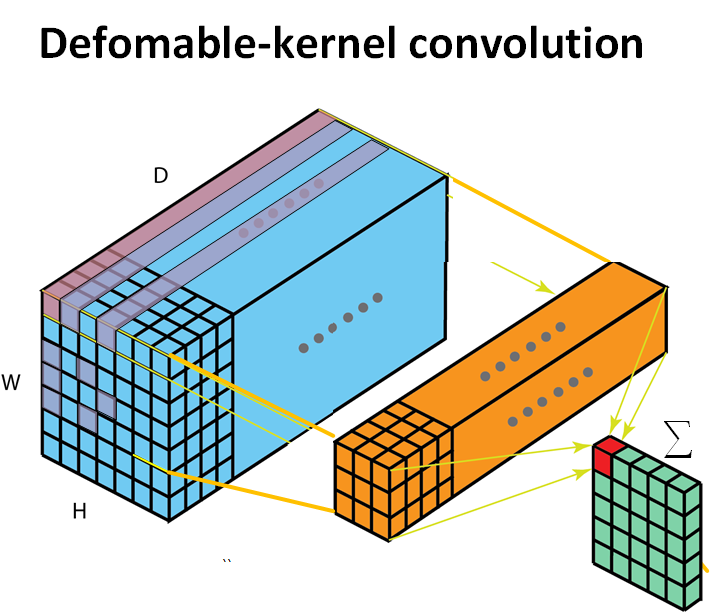     -->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:35px'>

Some explanation of deformable convolution
<div>
    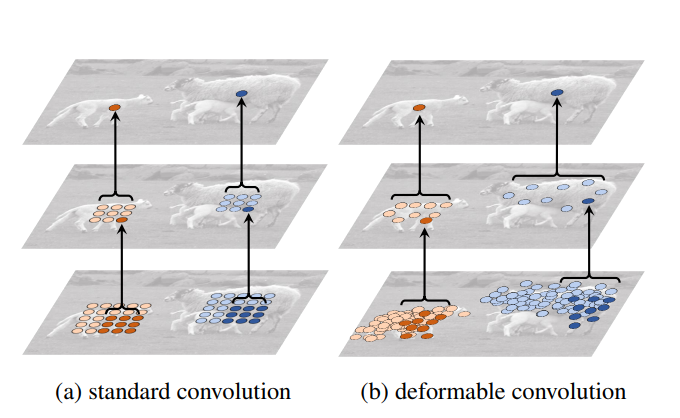
    </div>
<!-- 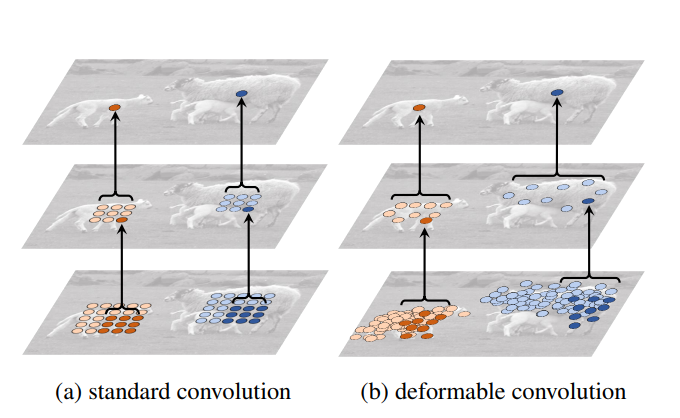 -->

<!-- https://towardsdatascience.com/deformable-convolutions-demystified-2a77498699e8  -->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:35px'>
    
<li> <b>Grouped-kernel Convolution</b> (for instance, $3\times 3\times C/2$ and $3\times 3\times C/2$).
    <ul>Reduce the number of parameters in each convolution 
        (for simultaneously computations optimization).</ul>
<div>
    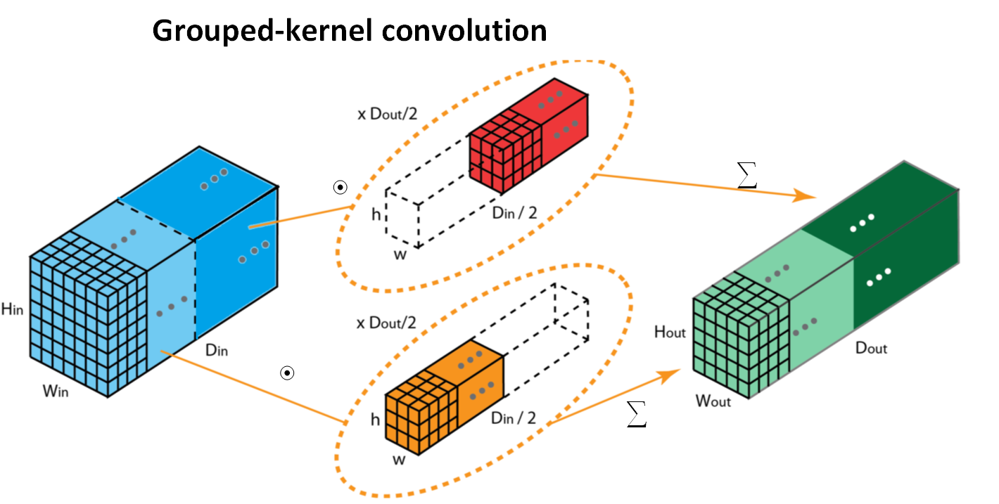
    </div>
<!-- 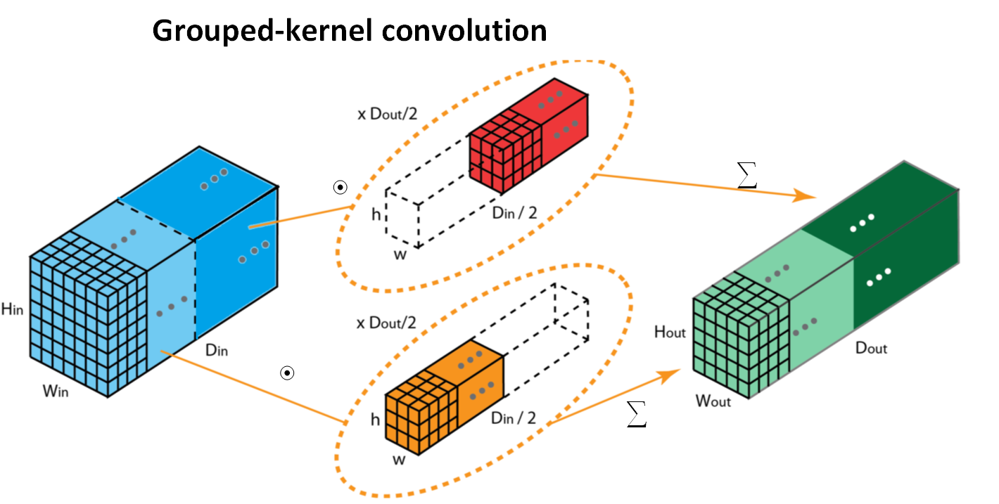     -->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:35px'>
    
<li> <b>3D-kernel Convolution</b> (for instance, $3\times 3\times 3$ with sliding through 3 dimensions).  
    <div>
    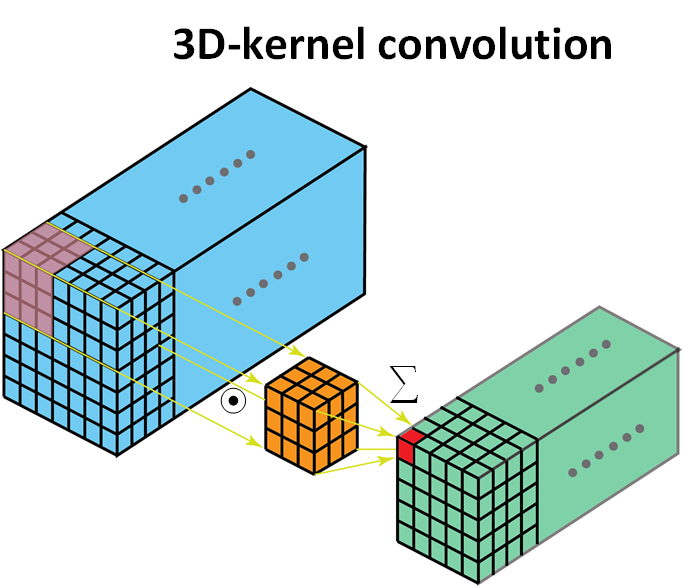
    </div>
<!-- 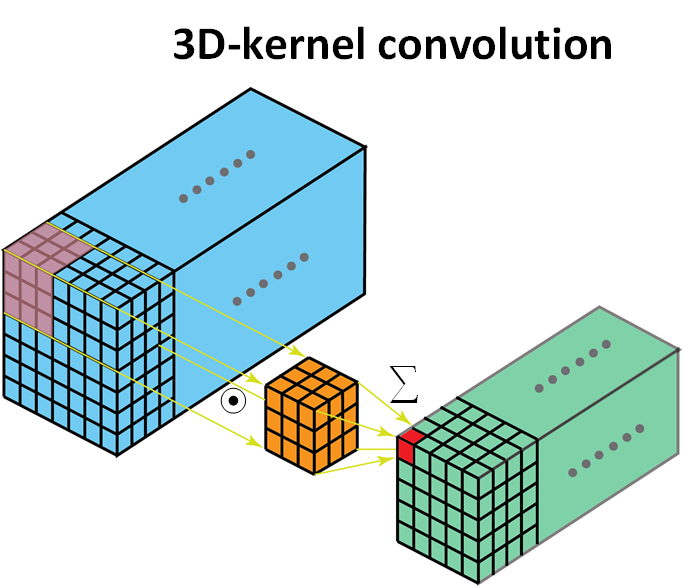     -->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:35px'>
    
<li> <b>Rectangular-kernel convolution </b> (<b>spatial convolution</b>) (for instance, $1\times 3\times C$ or $3\times 1\times C$).
    <ul>Reduce the number of parameters.</ul>
    
<div>
    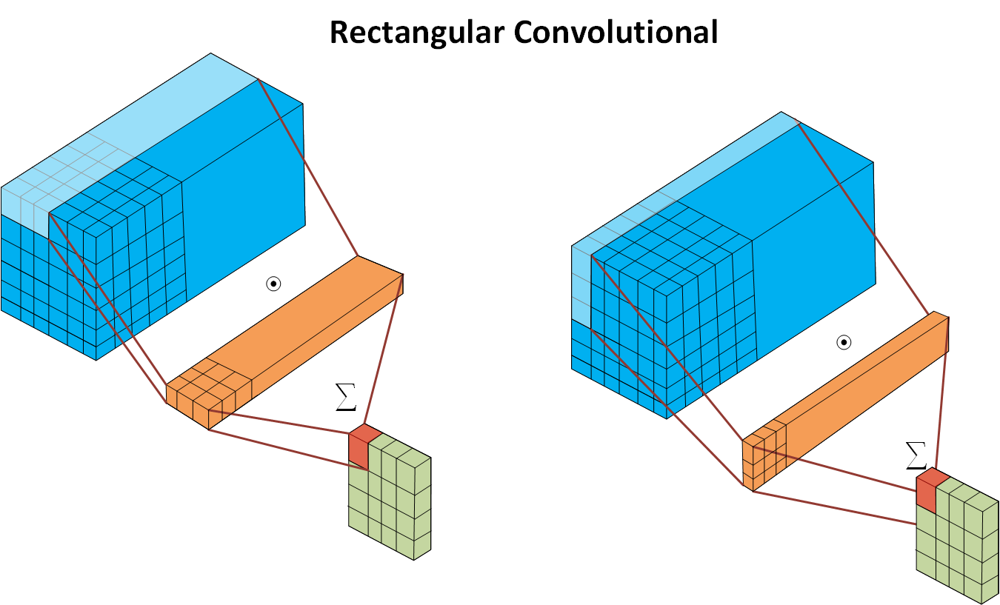
    </div>
<!--     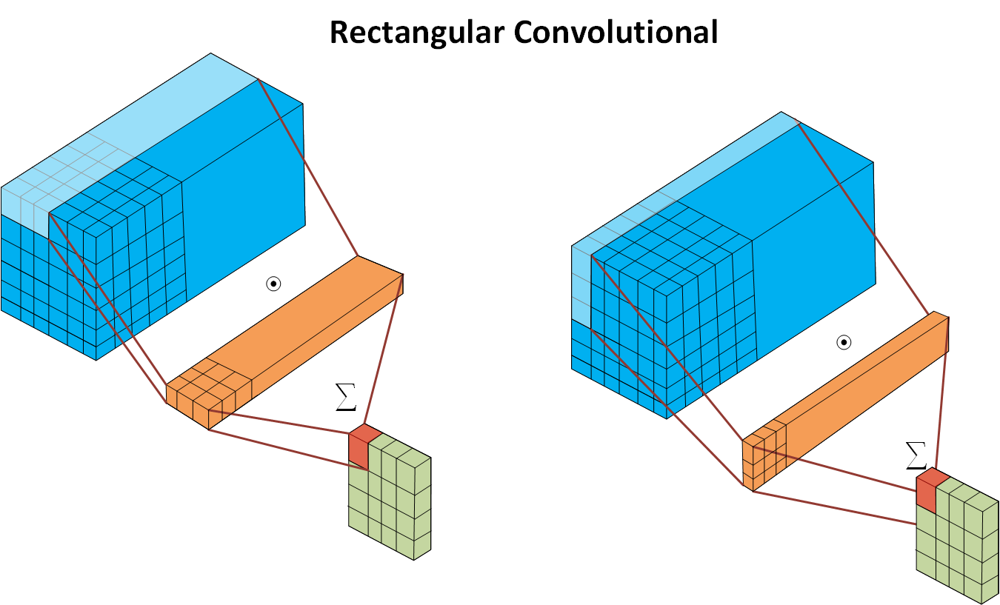 -->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:35px'>

<ul>   <b>Spatially Separable Convolution</b> (for instance, 1-stage $C \cdot 3\times 1\times 1$; 
                                          2-stage $C \cdot 1\times 3\times 1$).<br>
       Combination of two sequential rectangular convolutions for replacing conventional rectangular convolution (with summation) </ul>    
    
<div>
    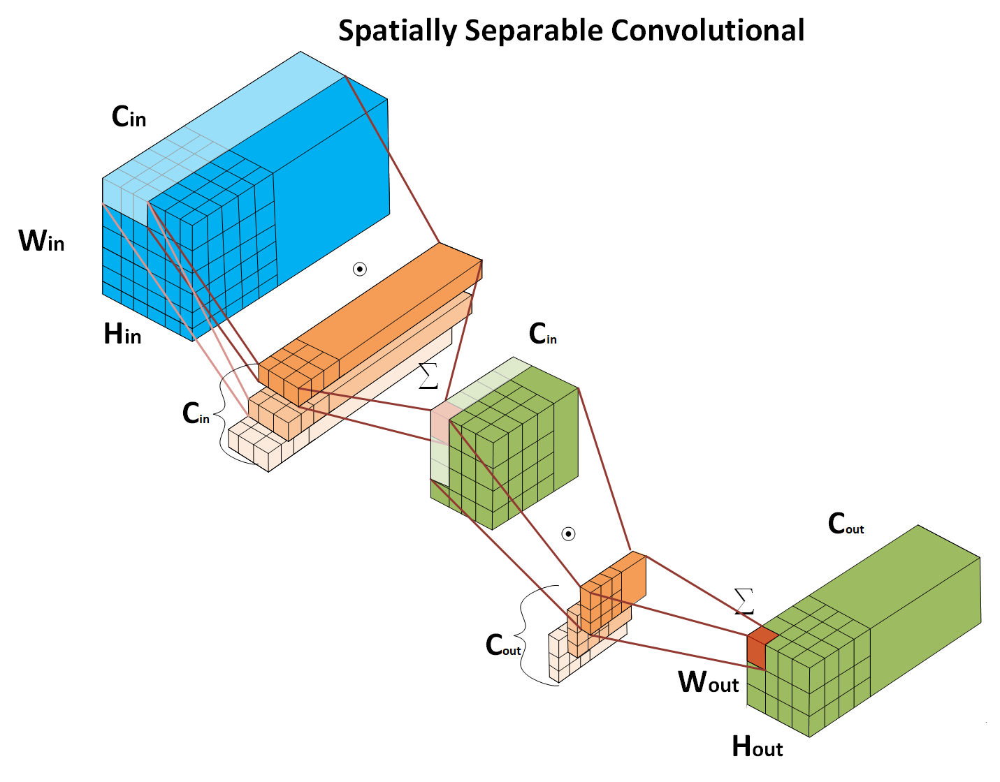

 </div>
    
<!-- ![image.png](attachment:image.png)     -->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:35px'>
 <ul> The Separable convolution is based on the following identity      

  
 <div>    
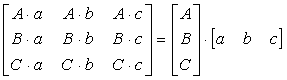
 </div>     
    Thus we can divide $3\times 3$ kernel into $3\times 1$ and $1\times 3$ parts.
     
  

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:35px'>
 <ul> For image with size $H\times W$ and $C$ channels lets considering $3\times 3$ convolution and <br> two layers $3\times 1$ and 
     $1\times 3$
 </ul>
 
<div>
    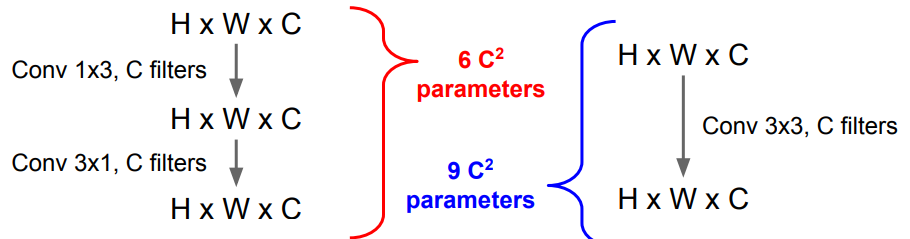
    </div>
<!-- 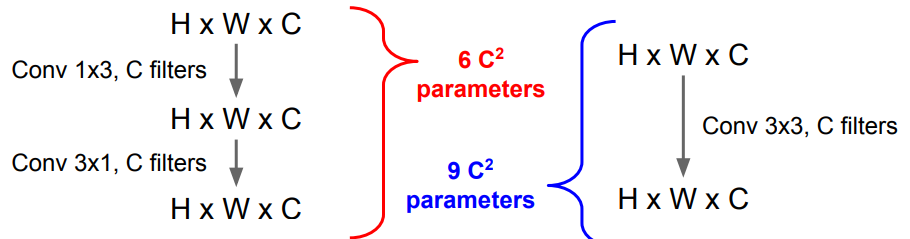     -->

<!-- http://cs231n.stanford.edu/slides/2016/winter1516_lecture11.pdf -->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:35px'>
    
<li> <b>Pointwise Convolution</b> (for instance, $1\times 1\times C$). 
    <ul>Reduce the number of channels(feature maps) or increase if it needed.
        The  Convolution is also known as <b>"Bottleneck Convolution"</b>.
    </ul>
    
<div>
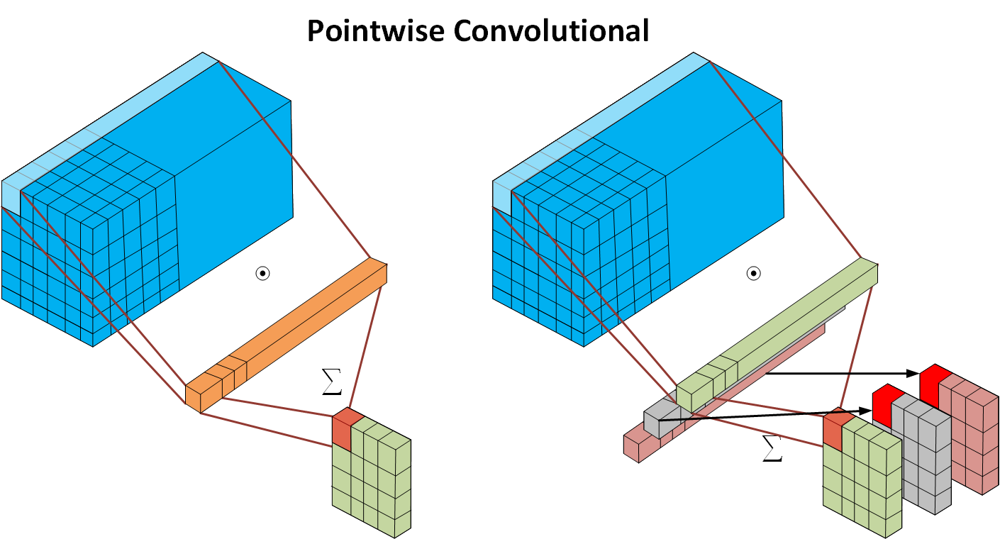
    </div>
<!-- 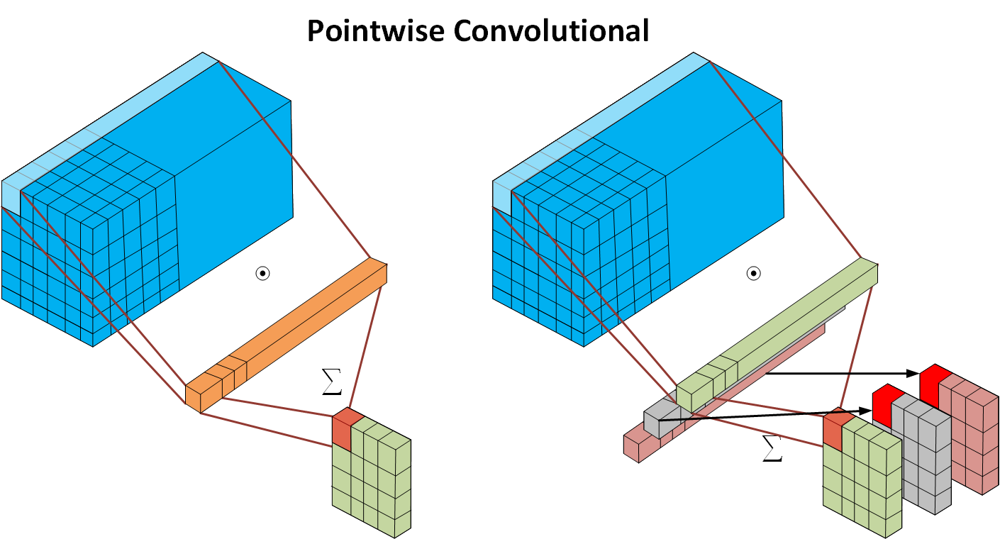     -->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:35px'>
 <ul> For image with size $H\times W$ and $C$ channels lets considering $3\times 3$ convolution and <br> three-layers bottle-neck $1 \times 1 \times C/2$;   $3 \times 3 \times C/2$; $1 \times 1 \times C$ pipeline.

 </ul>
 
<div>
    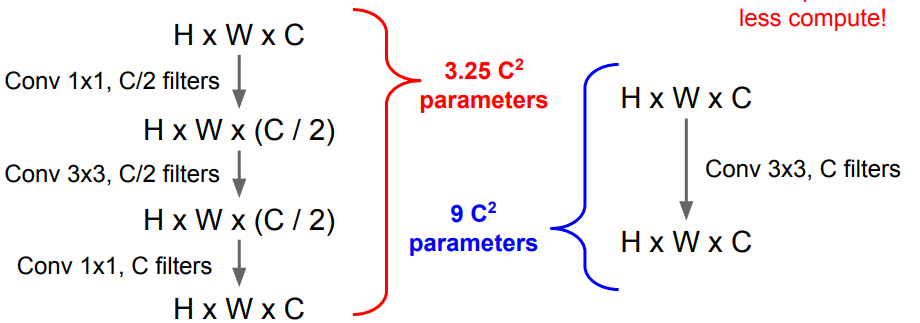
    </div>


<!-- http://cs231n.stanford.edu/slides/2016/winter1516_lecture11.pdf -->

<!--  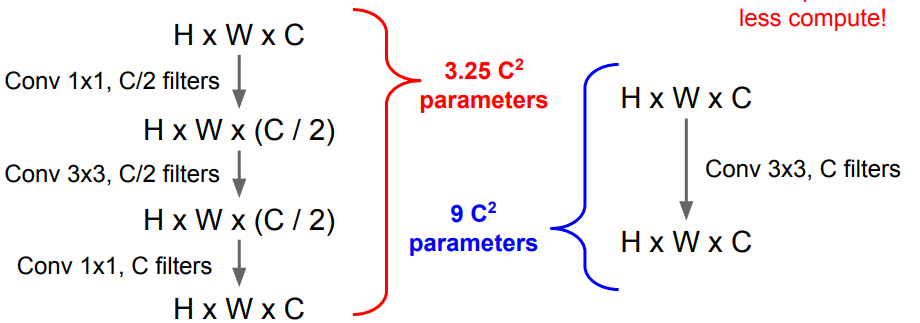-->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:35px'>
    
<li> <b>Deepwise-Convolution</b> (for instance, $C \cdot 3\times 3\times 1$). 
        <ul> This is auxiliary (almost always intermediate operation which differs from conventional one in replacing $\sum$ operation with <b>concatenation</b>.)</ul>
    <div>
    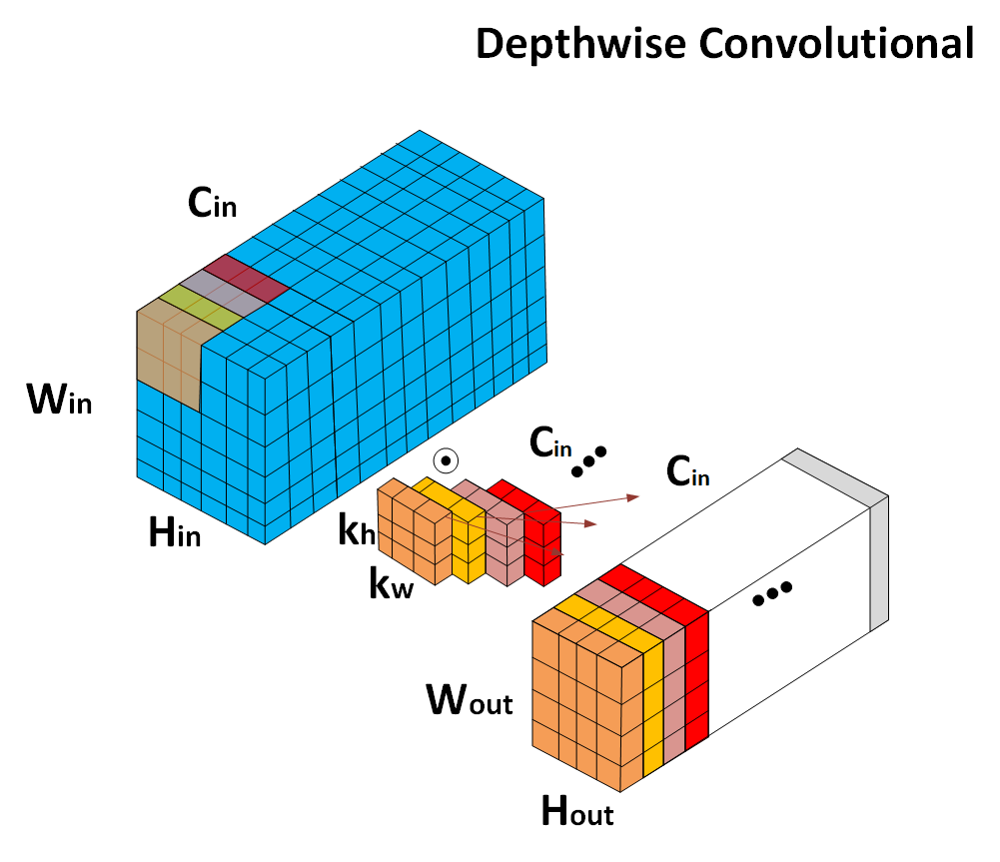
    </div>
<!-- ![image.png](attachment:image.png)     -->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:35px'>
    
<li> <b>Deepwise-Separable Convolution</b> (for instance, 1-stage $C \cdot 3\times 3\times 1$; 
                                                    2-stage $C \cdot 1\times 1\times 1$).  
        <ul> Combination of sequential rectangular convolution and point-wise convolution for reducing number of parameters in comparison with Spatially Separable Convolution </ul>
    <div>
    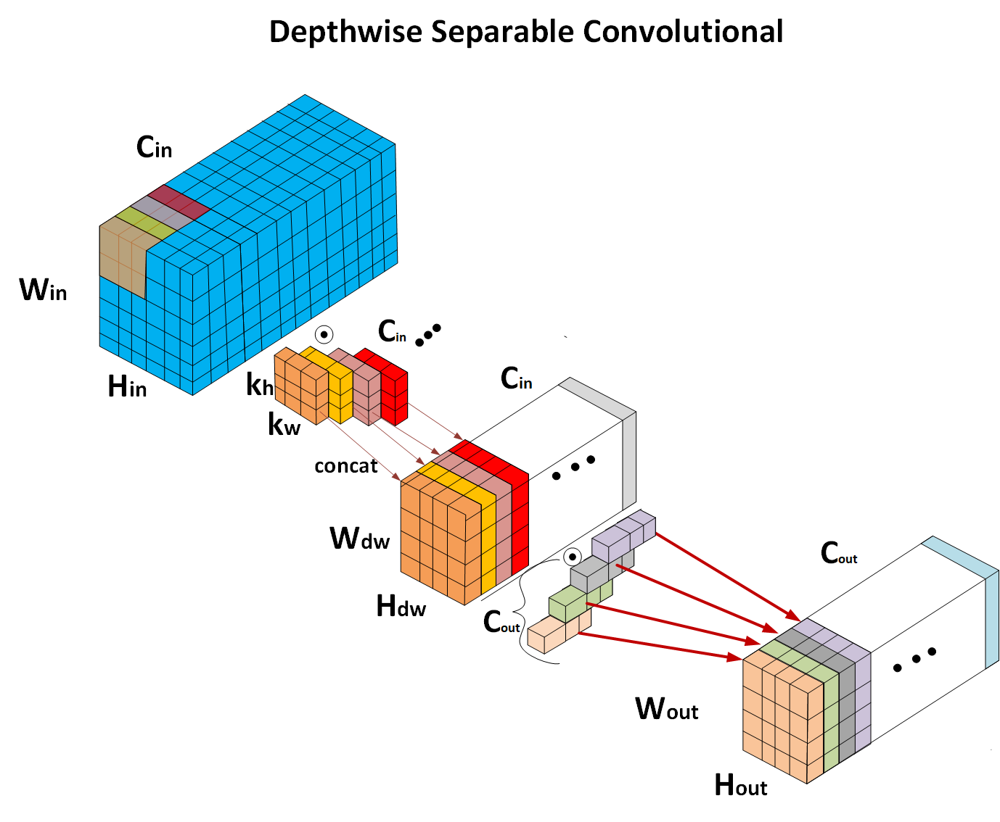
    </div>
 
<!-- 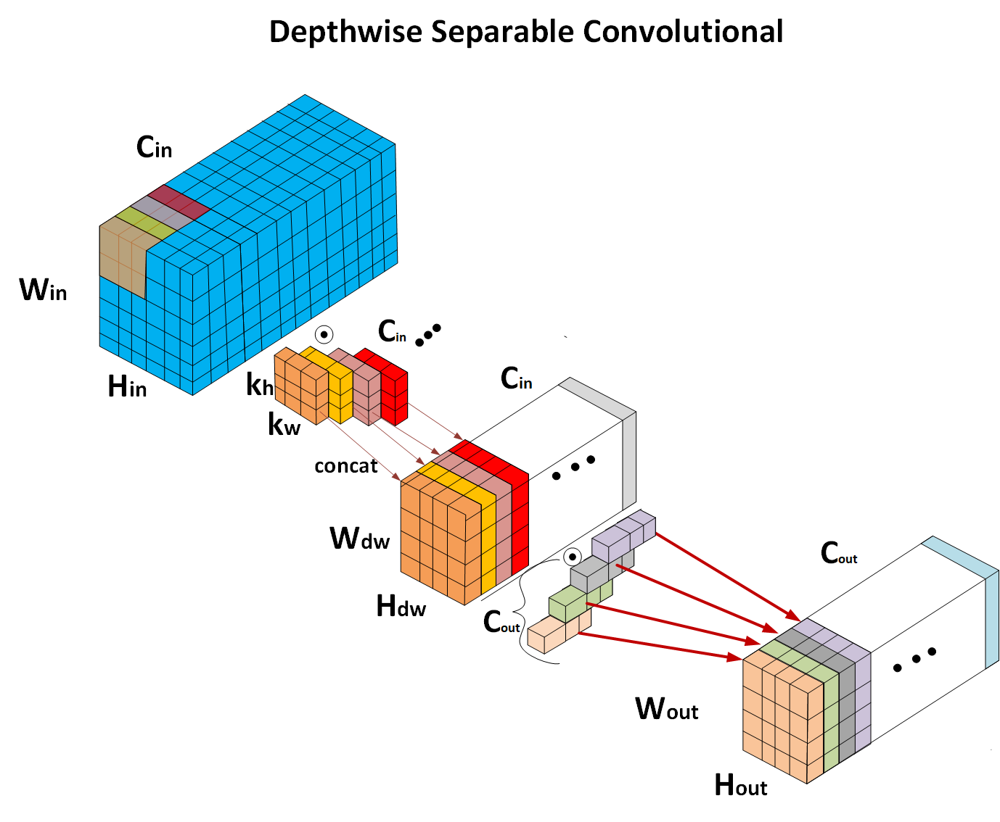     -->

![](https://miro.medium.com/max/600/1*OrIzzK51dQQGjXMiUD3gxg.gif)

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:35px'>
Some explanation of DeepWise Separable Convolution.<br>
It is the one of the most interesting ways to reduce number of parameters in comparison with traditional ones (square, rectangular end e.t.c.).
<br> For traditional convolution the number of parameters is
<span style='font-size:x-large'>    
    $$ P_{layer} =C_{out} \times C_{in}  \times k_w \times k_h + C_{out} = C_{out}\times P_{kernel}, $$
    </span>
    
where:<ul>
<li> $P_{layer}$ is the number of parameters in the layer.
<li> $ P_{kernel} = C_{in} \times k_w \times k_h + 1$ is the number of parameters for kernel.
<li> $C_{out}$ is the number output channels.   
<li> $C_{in}$ is the number input channels.
<li> $k_w$ and $k_h$ is the kernel dimension.
</ul> 
    <br>     
For Deep-wise separable convolution the number of parameters is 
<span style='font-size:x-large'>    
$$ P_{layer} = (C_{in} \times k_w \times k_h + C_{in}) + C_{out} \times 1 \times 1 \times C_{in} + C_{out}= \\= 
C_{in}\times P_{kernel_{DW}} + C_{out}\times P_{kernel_{point}}
, $$
    </span>    
where:
<li> $P_{layer}$ is the number of parameters in the layer.
    
<li> $P_{kernel_{DW}} = \times k_w \times K_h + 1$ is the number of parameters for each Deepwise kernel (input kernel).
    
<li> $P_{kernel_{point}} = 1 \times 1 \times C_{in} + 1$ is the number of parameters for the pointwise kernel. 

<li> $C_{out}$ is the number output channels. 
    
<li> $C_{in}$ is the number input channels.
    
<li> $k_w$ and $k_h$ is the kernel dimension.  
    
</ul> <br>



<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:35px'>

Thus for common case - kernel $3\times3$ with 16 input channels and 32 output channels we have:<br>
$$ 
\frac{  P_{layer_{TR}}  }
      { P_{layer_{DS}}  }=
      $$
$$      = 
      \frac{ C_{out} \times P_{kernel} }
        {C_{in}\times P_{kernel_{DW}} + C_{out}\times P_{kernel_{point}}}\sim 
\frac{32\times(16\times 3\times 3+1) }{16\times(3\times 3+1)+32\times 17}=\frac{4640}{704}=6.5
$$      



    
    
    
<div>
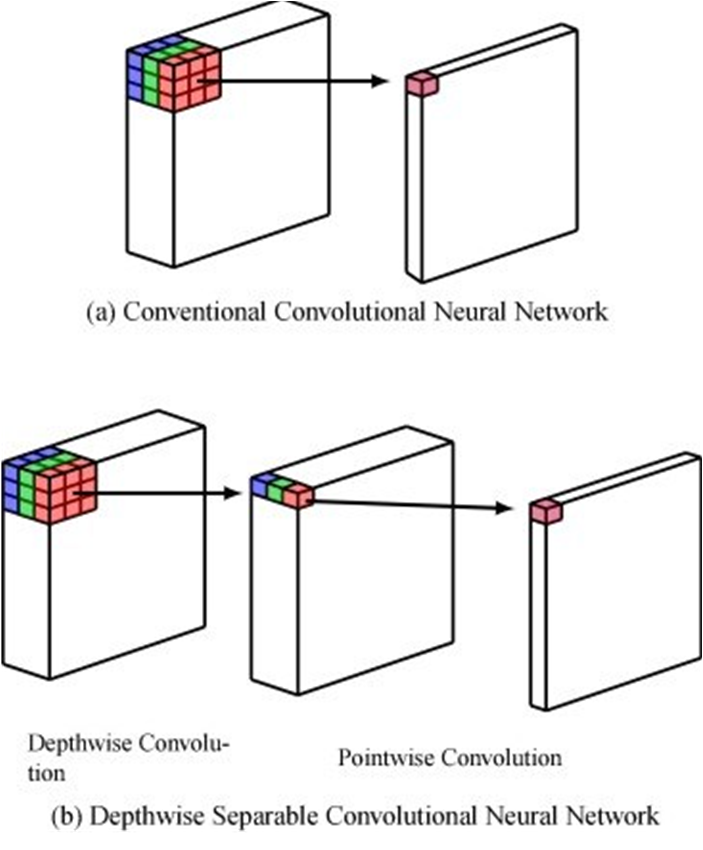
</div>
    
<!-- 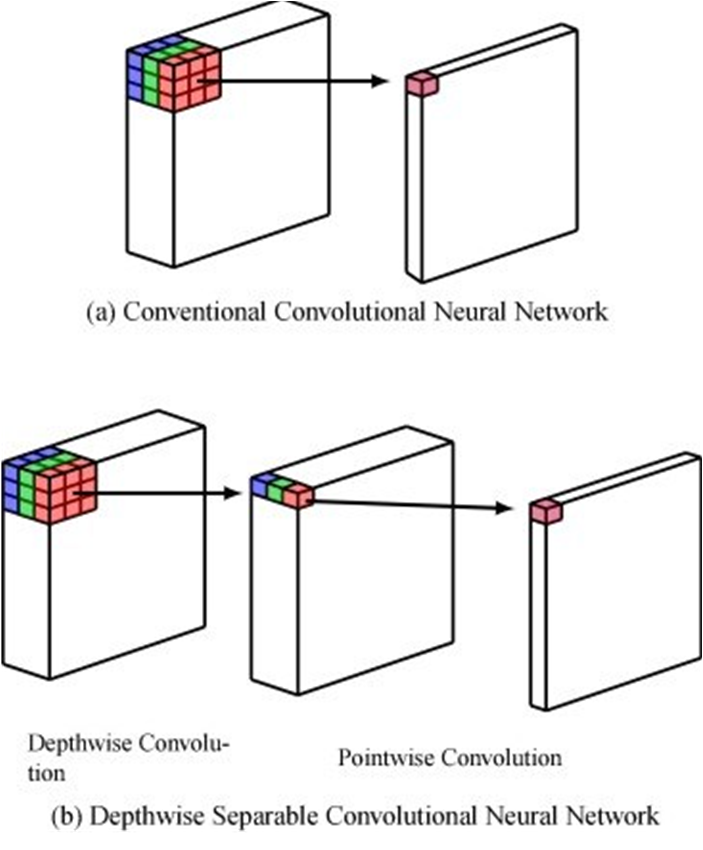 -->


    

 <font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:35px'>
    <em>Noet</em> <ul>
 <li>   A depthwise convolution may also have a channel multiplier. If the channel multiplier is 2, then for each input channel it creates 2 output channels (and learns 2 different sets of weights).
<li>  benefit of splitting the regular convolution operation into two steps is that now we can apply a ReLU twice instead of just once.
    <!-- https://machinethink.net/blog/googles-mobile-net-architecture-on-iphone/ 
https://machinethink.net/blog/mobile-architectures/-->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:35px'>
    
<li> <b> Network in Network Convolution</b> (for instance, $ \text{concat}[
                                                    3\times 1\times C, 
                                                    1\times 3\times C,
                                                    1\times 1\times C, 
                                                    \text{skip}]$). 
    <ul> An modification of layer idea as built in a combination of grouped, dialed and other variants of convolutions (including skip-connection one) to increase the feature extraction. </ul>
<div>
    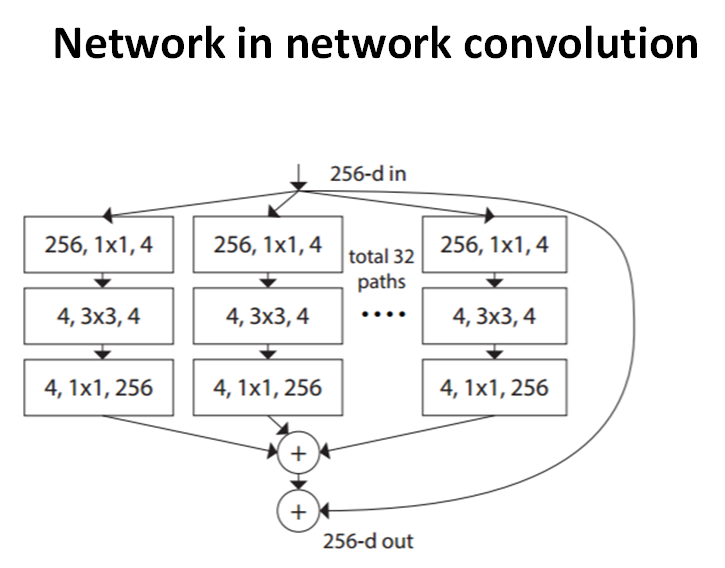
    </div>    
<!-- 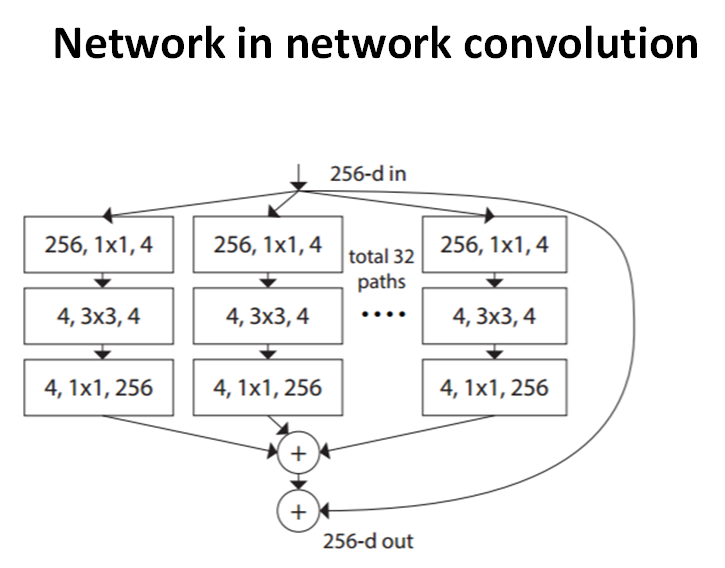     -->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:35px'>
    <ul>
        other implementations </ul>
<div>
    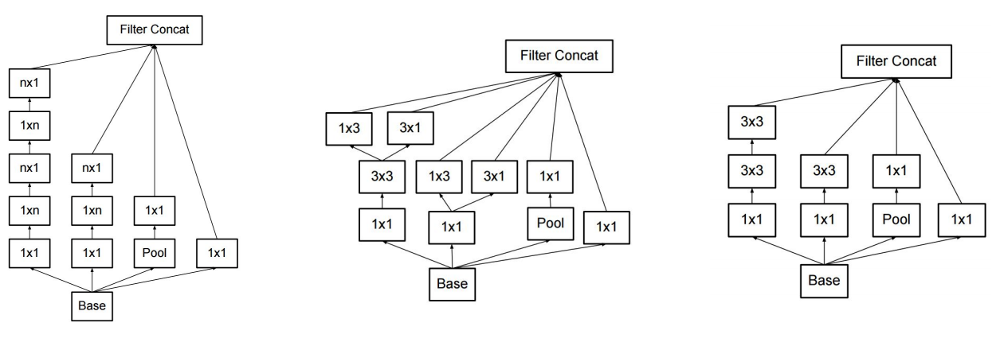
    </div> 

<!-- 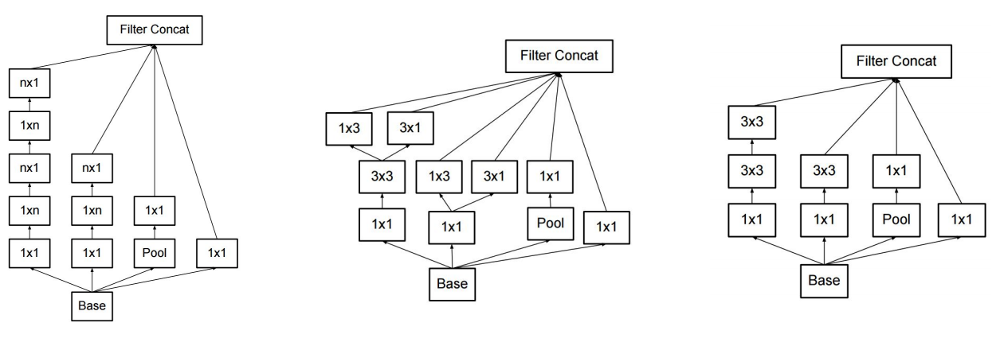     -->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:35px'>
    <ul>
        It also can be concatenation inplace of summation </ul>
<div>
    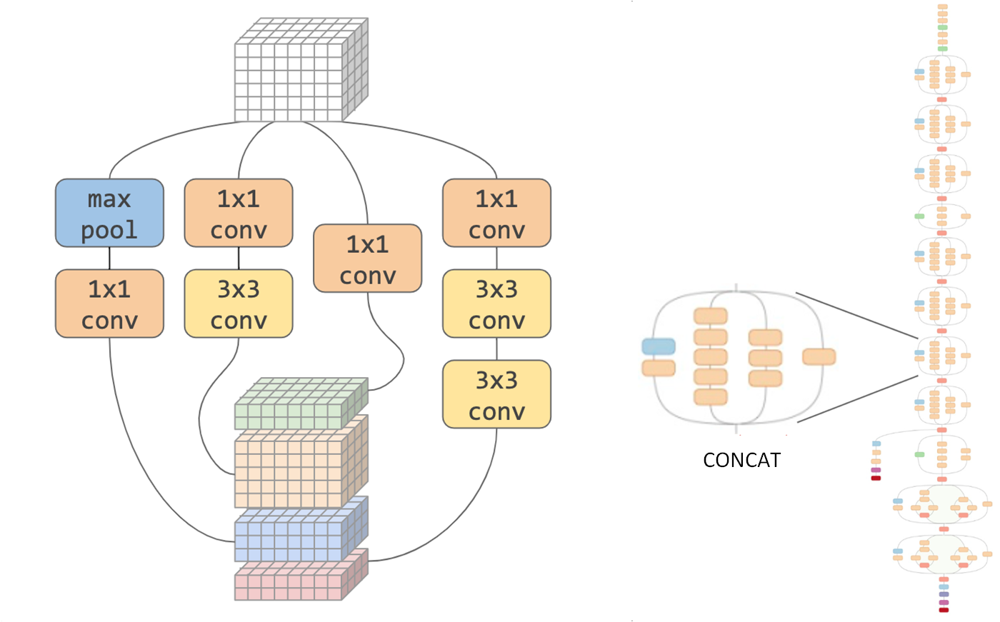
    </div> 

<!-- 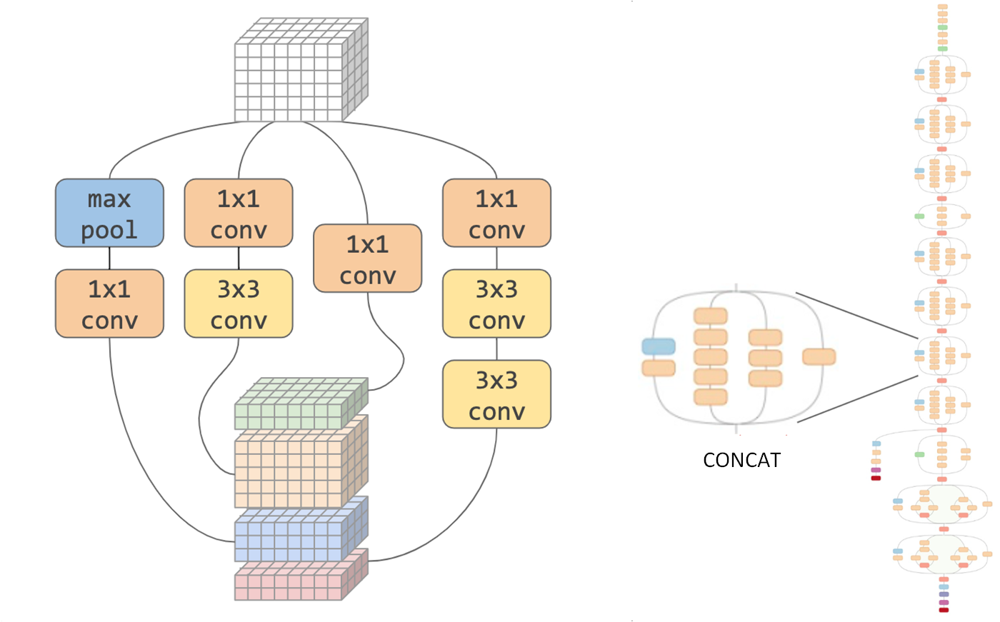     -->

<!-- https://codelabs.developers.google.com/codelabs/keras-flowers-tpu#9 -->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:35px'>
    
<li> <b>Pyramid-Dialed-kernel Convolution</b> (for instance, 
    $\text{concat}[ 3\times 3\times C \text{, rate=1 };
                    3\times 3\times C \text{, rate=2 };
                    3\times 3\times C \text{, rate=4 }]$). 
    <ul> An modification of dialed convolution idea as Network in Network Convolution combination of several rate (including skip-connection) to to increase the feature extraction. </ul>   
<div>
    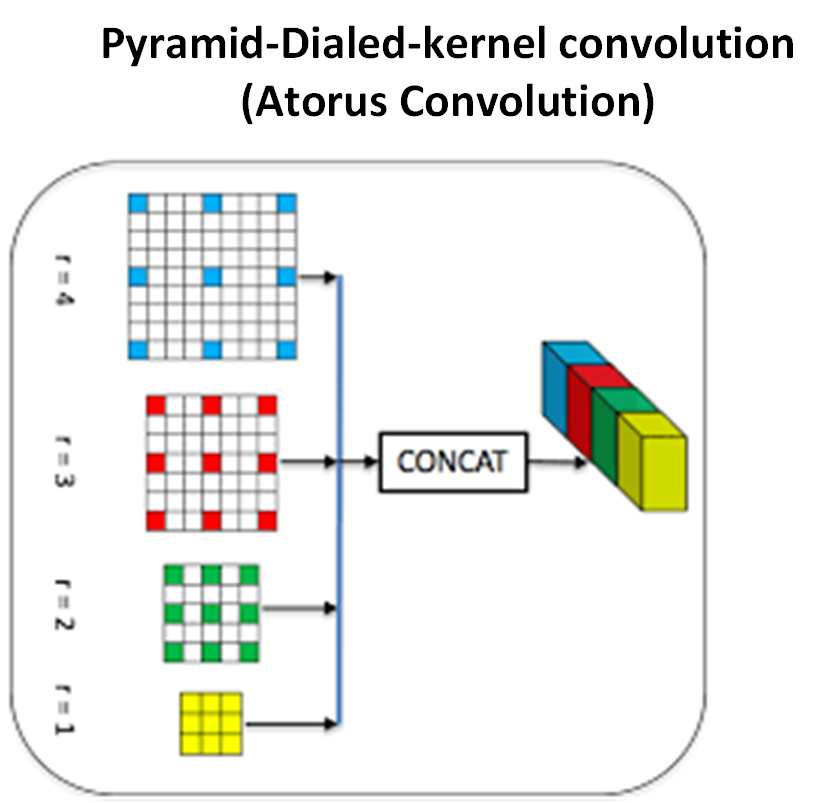
    </div>
<!-- 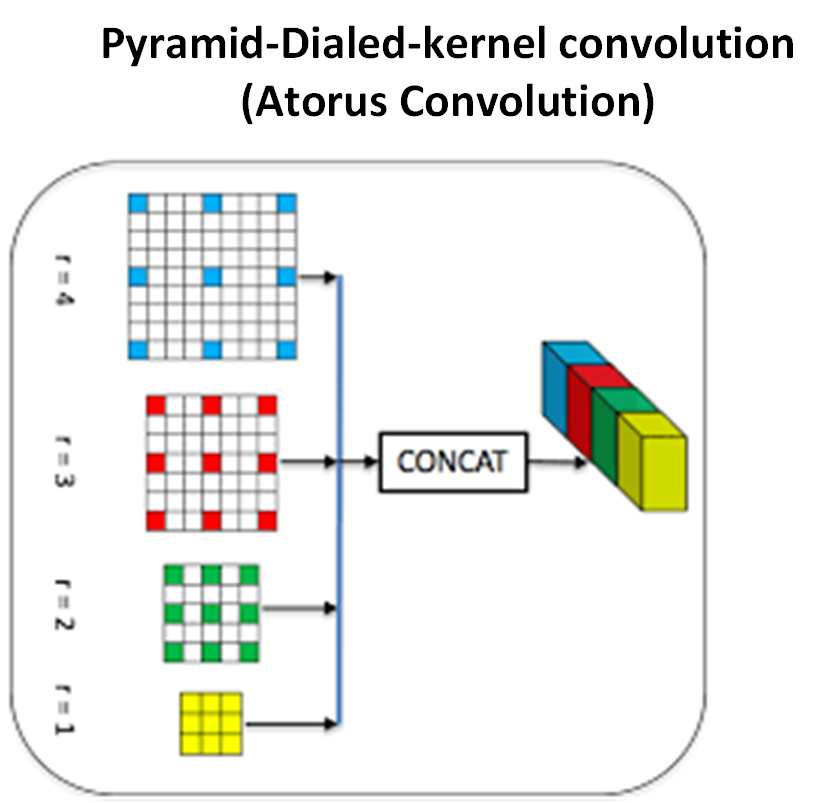     -->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:35px'>
    
<li> <b> Attention convolution </b> (for instance, $[3\cdot 1\times 1\times C+ 1\times 1\times C]$).
    <ul> The main idea is to produce dynamically change weights that trained for some feature highlighting.</ul>    

<div>
    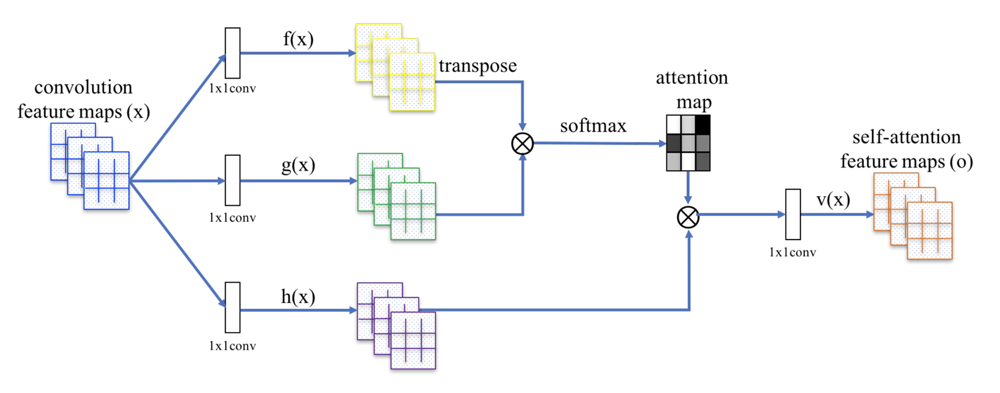
    </div>
<!-- 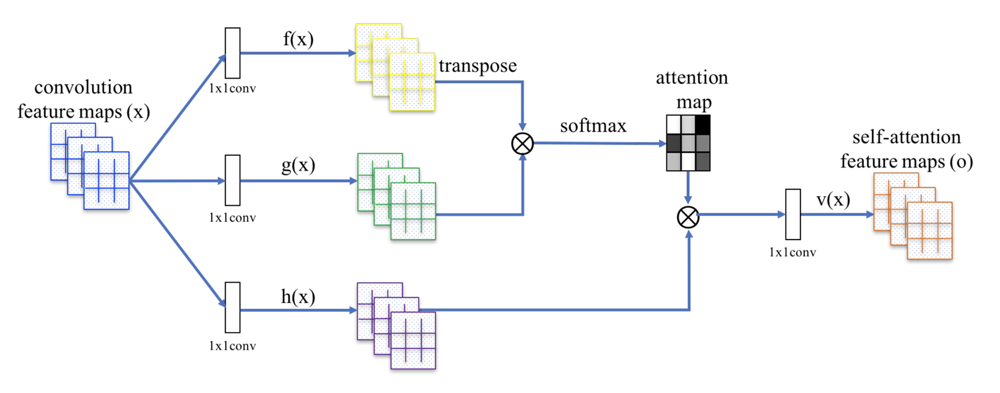     -->
     


<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:65px; margin-top:-35px; margin-bottom:-35px'>    
Key: $K=f(x)=W_fx$<br>
Query: $Q=g(x)=W_gx$<br>
Value: $V=h(x)=W_hx$<br>
$$\text{Attention}(\mathbf{Q}, \mathbf{K}, \mathbf{V}) = \text{softmax}(\frac{\mathbf{Q}\mathbf{K}^\top}{\sqrt{size}})\mathbf{V}$$

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:65px; margin-top:-35px; margin-bottom:-35px'>    
 Example of how attention work for different classes
<div>
    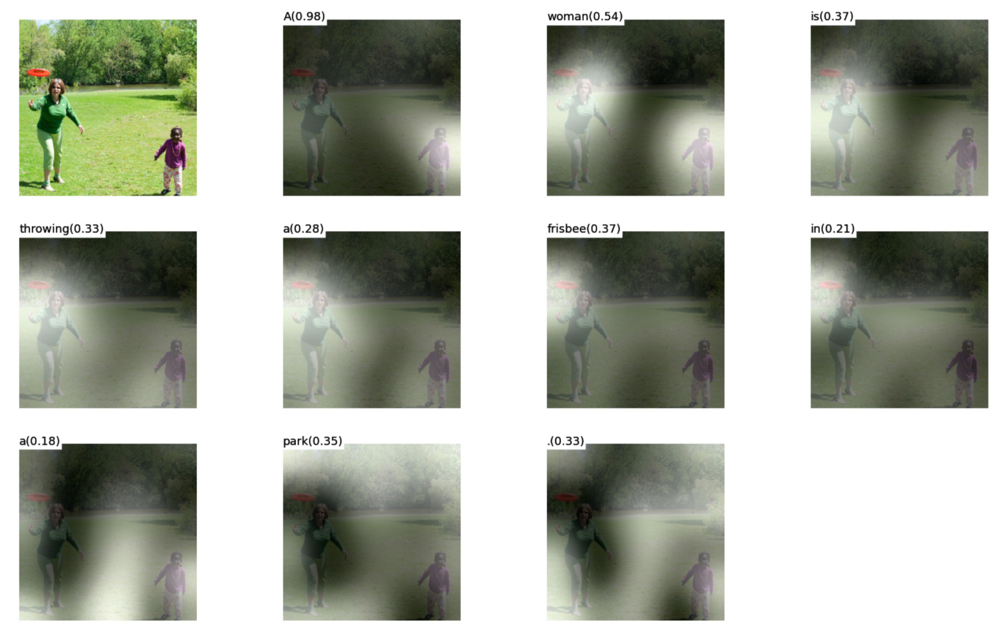
    </div>
<!-- 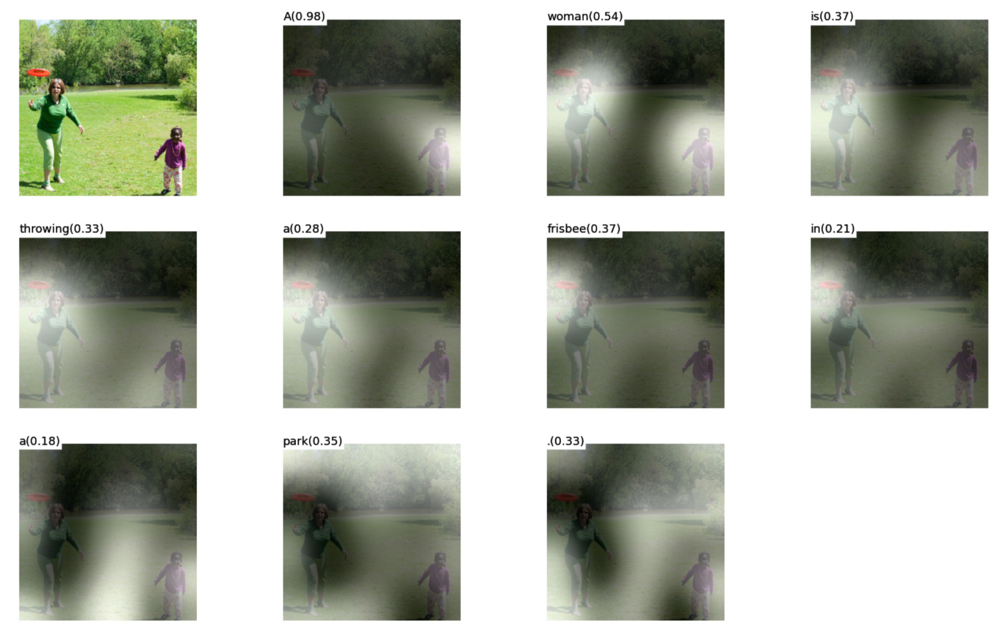     -->
<!-- https://lilianweng.github.io/lil-log/2018/06/24/attention-attention.html -->


<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:65px; margin-top:-35px'>    
 Example of how attention work for image  description
<div>
    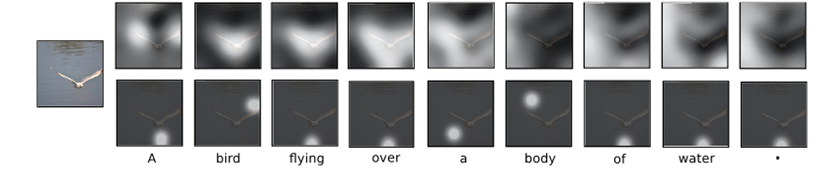
<!--     </div>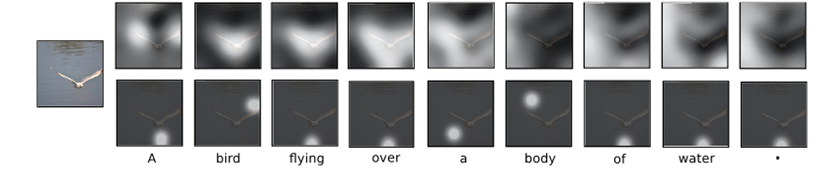 -->
<!-- ![image.png](attachment:image.png)     -->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:35px'>
    
<li> <b>Pixel-shuffle (high resolution) convolution</b> (for instance, $\text{shuffle}[9\cdot 3\times 1\times C]$).
    <ul> The main idea is to increase output dimension by shuffling feature extracted by several 2d-kernels.</ul>
<div>
<!--     <img src="attachment:image.png" width="600"> -->
    </div>
<!-- ![image.png](attachment:image.png)     -->

<div>
    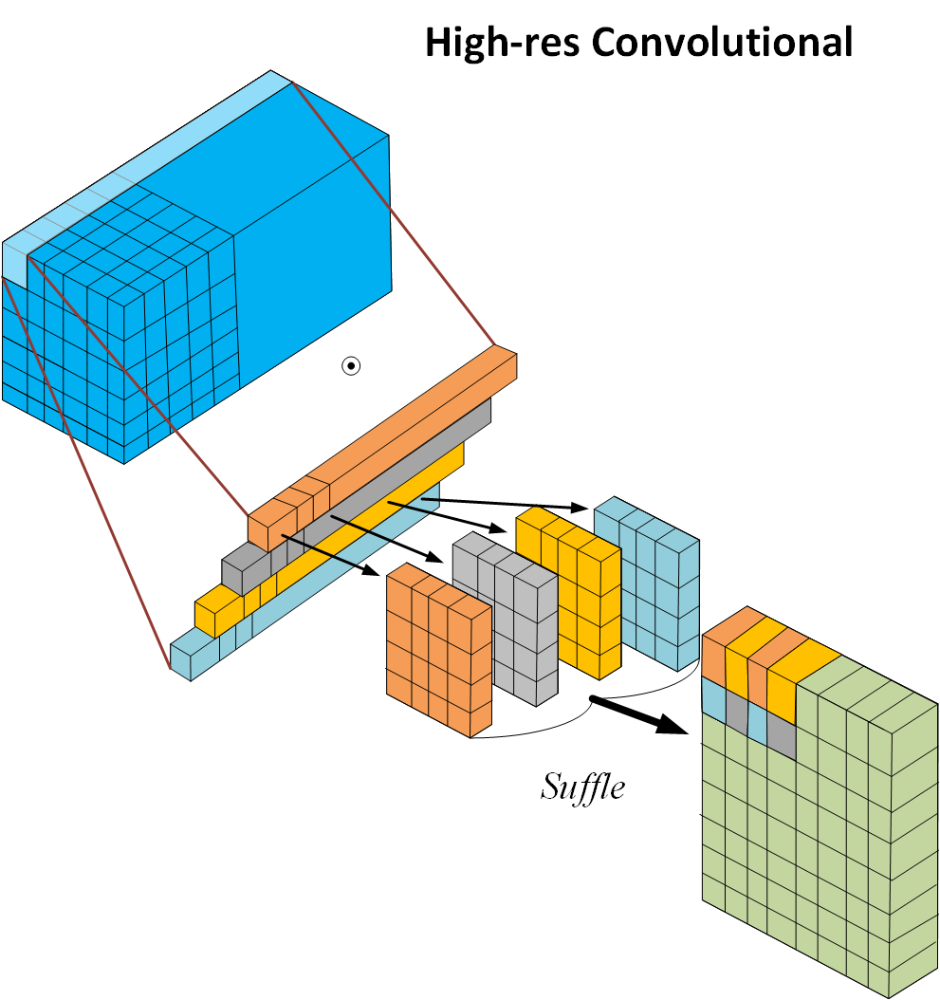
    </div>
    <!-- 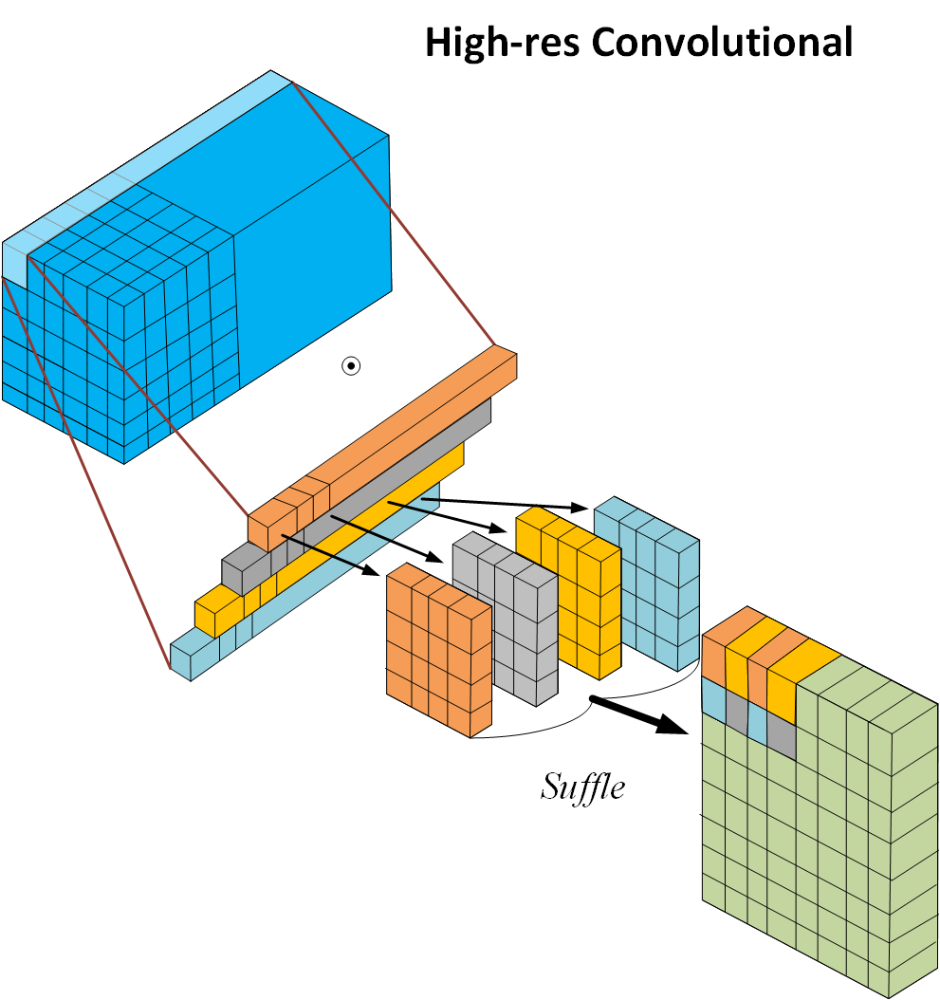 -->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:35px'>
<ul>
Some explanation of pixel shuffle.
<br> In fact your need to take point-wise convolution first for extract $N=C\times C$ number of channels (for image or feature map with $W\times H\times C$ dimension).
<br> From these $1,2,3,…, N$ outputs of point-conv, where $N$ is $CxC$, take one pixel at a time from each consecutive layer from $1,2  \text{ to } N$ and then shuffle them to get the output.
</ul>
    
![](https://miro.medium.com/max/600/1*A6i6__d2OMJOJStUQffrkw.gif)

<div>
    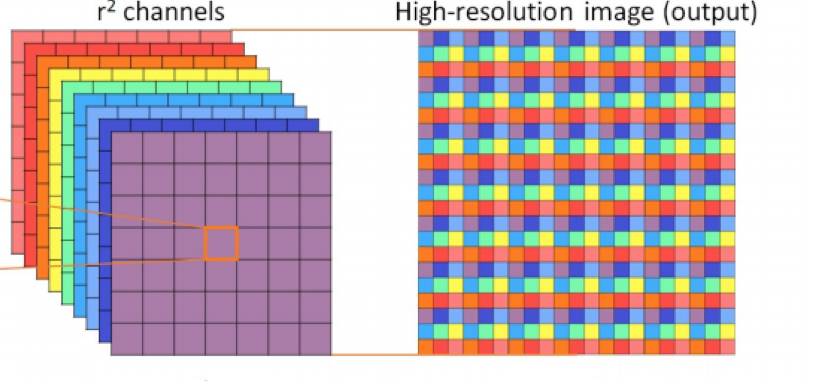
    </div>


<!-- 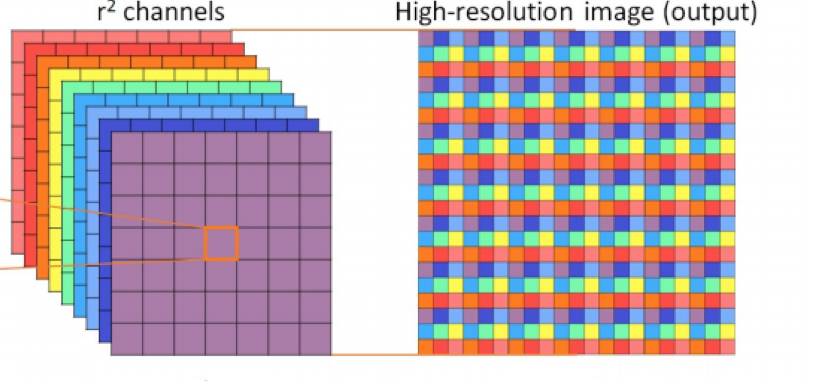 -->

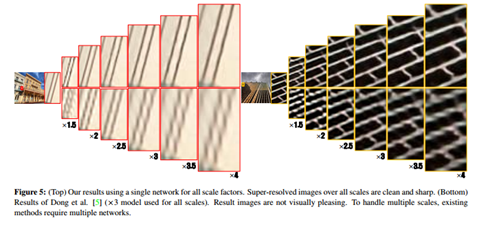


<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:35px'>
<ul>    

<!--      Beside the high-resolution convolution the authors of this concept proposed<br> -->
<!-- <b>Sub-Pixel Convolution </b> <br> -->
<!--     Sub-Pixel Convolution  is the Convolution for the image with extension by zero padding with certain stride.<br>
In this terms it can be introduced stride=$1/2$ or any other.<br> -->
<!-- </ul>   -->
<!-- <div> -->
    
<!-- <img src="attachment:image.png" width="600"> -->
<!--     </div> -->
<!-- ![image.png](attachment:image.png)     -->    
    


<!-- https://arxiv.org/ftp/arxiv/papers/1609/1609.07009.pdf -->

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:35px'>

<li>The reverse to the convolution operation is the <b>Transposed Convolution</b>.<ul>
The transposed convolution is also called <b>de-convolution</b> or <b>Fractionally Strided Convolutions</b>.

The transposed convolution is widely using in many application, starting from:<ul>
<li> backward propagation in CNN model training.
<li> reverse convolution (de-convolution) in segmentation learning (and auto-encoders).
<li> up-sampling technique.    
</ul><br>

For the first let's re-write <b>straight convolution</b> in matrix form as did it before

$$\text{straight convolution: }r = k\ast x = \boldsymbol{k}\cdot \vec{x},$$ 
Then we can reconstruct the input by <b>pseudo-inverse matrix operation as:</b>
$$\text{pseudo-inverse convolution: } \vec{x} = \frac{\boldsymbol{k^T}\cdot r}{\boldsymbol{k}\cdot \boldsymbol{k^T}} $$
However, in fact we do not need to take denominator due to our reason is to increase the dimension.<br>
so the <b>transposed convolution</b> can be given as:
$$\text{transposed convolution: } \vec{x} = \boldsymbol{k^T}\cdot r $$
    </ul>


<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:35px'>

<table style="width:100%; table-layout:fixed;">
    <caption style='color:black; font-size:large; text-align: center'>Transposed convolutions</caption>  
  <tr>
    <td><img width="150px" src="https://github.com/vdumoulin/conv_arithmetic/raw/master/gif/no_padding_no_strides_transposed.gif"></td>
    <td><img width="150px" src="https://github.com/vdumoulin/conv_arithmetic/raw/master/gif/arbitrary_padding_no_strides_transposed.gif"></td>
    <td><img width="150px" src="https://github.com/vdumoulin/conv_arithmetic/raw/master/gif/same_padding_no_strides_transposed.gif"></td>
    <td><img width="150px" src="https://github.com/vdumoulin/conv_arithmetic/raw/master/gif/full_padding_no_strides_transposed.gif"></td>
  </tr>
  <tr>
    <td style='color:black; font-size:large; text-align: center'>No padding, no strides</td>
    <td style='color:black; font-size:large; text-align: center'>Arbitrary padding, no strides</td>
    <td style='color:black; font-size:large; text-align: center'>Half padding, no strides</td>
    <td style='color:black; font-size:large; text-align: center'>Full padding, no strides</td>
  </tr>
  <tr>
    <td><img width="150px" src="https://github.com/vdumoulin/conv_arithmetic/raw/master/gif/no_padding_strides_transposed.gif"></td>
    <td><img width="150px" src="https://github.com/vdumoulin/conv_arithmetic/raw/master/gif/padding_strides_transposed.gif"></td>
    <td><img width="150px" src="https://github.com/vdumoulin/conv_arithmetic/raw/master/gif/padding_strides_odd_transposed.gif"></td>
    <td></td>
  </tr>
  <tr>
    <td style='color:black; font-size:large; text-align: center'>No padding, strides</td>
    <td style='color:black; font-size:large; text-align: center'>Padding, strides</td>
    <td style='color:black; font-size:large; text-align: center'>Padding, strides (odd)</td>
    <td></td>
  </tr>
</table>


<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:35px'>
    
>*Note* In the case of padding or striding the input image should be transformed to the expected one by adding zeros element (white in the figures above).

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:35px'>
    
>*Note*  Examples of straight and transposed convolution for 1d matrix with stride 1 and 2
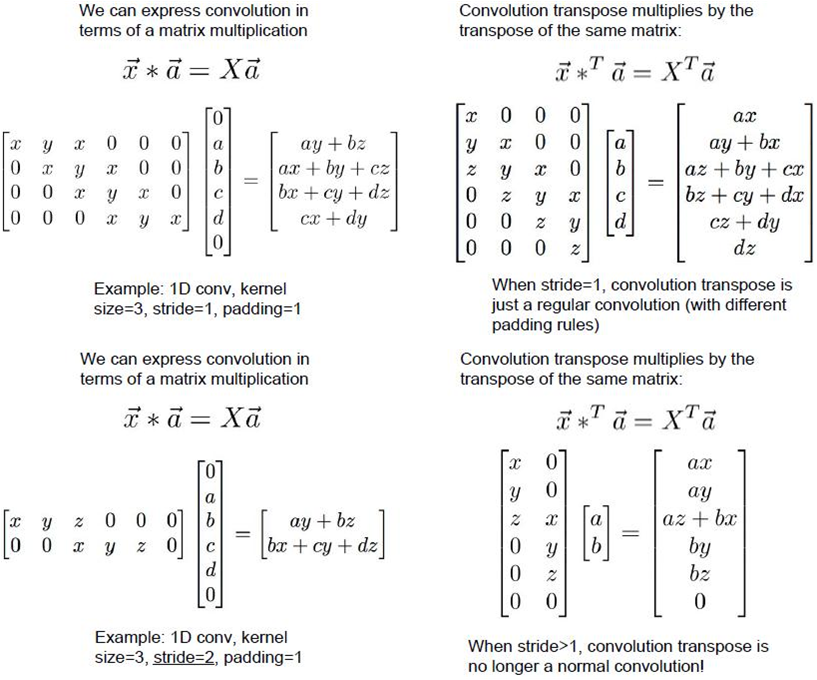
    
<!--     https://www.programmersought.com/article/709640128/ -->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:35px'>

>*Note* the full list of other not-popular convolutions types can be found [here](https://paperswithcode.com/methods/category/convolutions)